Motivation

To understand classifier outcomes and select appropriate classification models

Study summary

The Departments of Neurology and Neurosurgery would like to study the possibility of predicting which of their patients is at risk of presenting a brain stroke. Since it is known that several factors such as smoking, hypertension or obesity are related to an increased risk of stroke, they designed a multi-institutional study collecting that information from a large number of patients who were followed up to record whether they had a stroke or not.

Goal: To identify if the risk of stroke can be identified using the collected dataset.

        Build and evaluate the performance of: a random forest classifier, a linear support vector machine classifier, and a logistic regression classifier. Feel free to evaluate non-linear support vector machines if curious.
        Discuss the similarities and differences between the performance of the three trained classifiers in terms of ROC curve and the distributions of their probabilistic predictions.
        Explain which approach you would deploy clinically and justify the reasons for it.


In [90]:
import numpy as np
import pandas as pd
import scipy
import shelve
import matplotlib.pyplot as plt
import statsmodels.api as sm
import sklearn
from sklearn.linear_model import LinearRegression
import seaborn as sns
from matplotlib.backends.backend_pdf import PdfPages
import category_encoders as ce
import seaborn as sns
from scipy.stats import normaltest
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.impute import SimpleImputer
from scipy.optimize import minimize
from scipy.stats import shapiro
from scipy.special import expit
from sklearn import svm
import shelve

from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import RocCurveDisplay
from sklearn.metrics import roc_auc_score
from sklearn.metrics import f1_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
import itertools
from sklearn.model_selection import ParameterGrid

In [3]:
df_brain_stroke = pd.read_csv("brain_stroke.csv")
print(df_brain_stroke.isna().sum())
print(df_brain_stroke.columns)
df_brain_stroke.head()

gender               0
age                  0
hypertension         0
heart_disease        0
ever_married         0
work_type            0
Residence_type       0
avg_glucose_level    0
bmi                  0
smoking_status       0
stroke               0
dtype: int64
Index(['gender', 'age', 'hypertension', 'heart_disease', 'ever_married',
       'work_type', 'Residence_type', 'avg_glucose_level', 'bmi',
       'smoking_status', 'stroke'],
      dtype='object')


,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,Male,67.0,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1
1,Male,80.0,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1
2,Female,49.0,0,0,Yes,Private,Urban,171.23,34.4,smokes,1
3,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1
4,Male,81.0,0,0,Yes,Private,Urban,186.21,29.0,formerly smoked,1


In [4]:
def onehot_encode_categorical(df, column_name, dropna = False):
    # encode sex
    if dropna:
        df = df.dropna()
    ohe = OneHotEncoder(sparse_output=False).fit(df[[column_name]])
    encoder_df = pd.DataFrame(ohe.transform(df[[column_name]]))
    #print(f'before = {encoder_df.columns}')
    encoder_df.columns = [f'{column_name}_{col}' for col in encoder_df.columns]
    #print(f'after = {encoder_df.columns}')
    df = df.join(encoder_df)
    df = df.drop(columns=[column_name])
    return(df, ohe)

categorical_cols = ["gender", "ever_married", "work_type", "Residence_type", "smoking_status"]
df_bs_encoded = df_brain_stroke.copy()
for cat_col in categorical_cols:
    df_bs_encoded, _  = onehot_encode_categorical(df_bs_encoded, cat_col)
df_bs_encoded.columns

Index(['age', 'hypertension', 'heart_disease', 'avg_glucose_level', 'bmi',
       'stroke', 'gender_0', 'gender_1', 'ever_married_0', 'ever_married_1',
       'work_type_0', 'work_type_1', 'work_type_2', 'work_type_3',
       'Residence_type_0', 'Residence_type_1', 'smoking_status_0',
       'smoking_status_1', 'smoking_status_2', 'smoking_status_3'],
      dtype='object')

In [5]:
def standardize_df(df, *cols):
    df_num = df.loc[:, [*cols]].copy()
    df.loc[:, [*cols]] = (df_num-df_num.mean())/df_num.std()
    return df

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


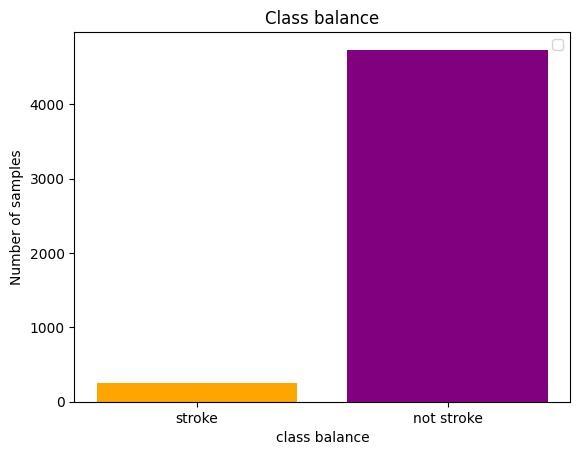

248

In [6]:
def viz_class_imbalance(df, label_col, title_str= "class balance"):
    ser = df.loc[:, label_col]
    pos_indices = ser[ser.values == 1].index
    neg_indices = ser[ser.values == 0].index
    n_pos = ser.iloc[pos_indices].count()
    n_neg = ser.iloc[neg_indices].count()
    plt.bar(["stroke", "not stroke"], [n_pos, n_neg], color = ['orange', 'purple'])

    plt.xlabel(title_str)
    plt.ylabel("Number of samples")
    plt.title("Class balance")
    plt.legend()
    plt.show()
    return(n_pos)

viz_class_imbalance(df_bs_encoded, "stroke")


In [7]:
vec = [int(x) for x in np.linspace(start=5, stop=50, num = 10 )]
vec

[5, 10, 15, 20, 25, 30, 35, 40, 45, 50]

In [8]:
def init_rf_grid():
    # Number of trees in random forest
    n_estimators = [int(x) for x in np.linspace(start = 5, stop = 30, num = 6)]
    # Number of features to consider at every split
    max_features = ['auto', 'sqrt']
    # Maximum number of levels in tree
    max_depth = [3, 5]
    # Minimum number of samples required to split a node
    min_samples_split = [2, 5, 10]
    # Minimum number of samples required at each leaf node
    min_samples_leaf = [1, 2, 4]
    # Method of selecting samples for training each tree
    bootstrap = [True, False]# Create the random grid
    rf_random_grid = {'n_estimators': n_estimators,
                'max_features': max_features,
                'max_depth': max_depth,
                'min_samples_split': min_samples_split,
                'min_samples_leaf': min_samples_leaf,
                'bootstrap': bootstrap}
                
    return(rf_random_grid)
rf_grid = init_rf_grid()
print(rf_grid)

{'n_estimators': [5, 10, 15, 20, 25, 30], 'max_features': ['auto', 'sqrt'], 'max_depth': [3, 5], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4], 'bootstrap': [True, False]}


In [9]:
df_numerical = df_bs_encoded.loc[:, ["age", "bmi", "avg_glucose_level"]]
scaler = StandardScaler()
scaler.fit(df_numerical)
df_numerical_scaled = scaler.transform(df_numerical)
df_copy = df_bs_encoded.copy()
df_copy.loc[:, ["age", "bmi", "avg_glucose_level"]] = df_numerical_scaled
df_copy


,age,hypertension,heart_disease,avg_glucose_level,bmi,stroke,gender_0,gender_1,ever_married_0,ever_married_1,work_type_0,work_type_1,work_type_2,work_type_3,Residence_type_0,Residence_type_1,smoking_status_0,smoking_status_1,smoking_status_2,smoking_status_3
0,1.040584,0,1,2.723411,1.193238,1,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
1,1.614270,0,1,-0.000523,0.589390,1,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
2,0.246250,0,0,1.448529,0.869222,1,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
3,1.570141,1,0,1.512650,-0.662492,1,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
4,1.658400,0,0,1.780895,0.073909,1,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4976,-0.106788,0,0,-0.794162,0.191733,0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
4977,-0.150917,0,0,1.890500,0.383197,0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
4978,0.069731,1,0,-0.242364,0.486294,0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
4979,-0.150917,0,0,-0.488199,0.221189,0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0


In [74]:

lr_grid = {'penalty': ["l1", "l2"], "C": [0.01, 0.1, 1]}
rf_grid = {'n_estimators': [20, 50, 100], 'max_features': ['log2', 'sqrt'], 'max_depth': [3, 5, 10], 'bootstrap': [True, False]}
svm_grid = {'C': [0.001, 0.01, 0.1, 1], 'gamma': ['scale', 'auto']}#, 'kernel': ['linear', 'poly', 'rbf', 'sigmoid']}

In [76]:
# a grid search function with cross validation that allows for proper scaling of test data (i.e., not using the full data to scale)

def grid_search_stratified_cv(df, col_label, model, grid, k_folds, cols_to_standardize = ["age", "bmi", "avg_glucose_level"], random_state = 0, class_weight = None):

    # initialize a performance dictionary to store results
    performance_dict = {}

    performance_dict['model'] = model

    # split features and labels
    y = df.loc[:, col_label]
    X = df.drop(columns = [col_label])

    param_grid = list(ParameterGrid(grid))
    for hp_i, hyper_params in enumerate(param_grid):
        performance_dict[f'hp_{hp_i}'] = {'hyper_params': hyper_params}
        for k in k_folds:
            cv = StratifiedKFold(n_splits=k, random_state=random_state, shuffle=True)
            performance_dict[f'hp_{hp_i}'][f'{k}_folds'] =  {"truth": [], "p_0": [], "p_1": [], "f1": [], "acc": []}
            performance_dict[f'hp_{hp_i}'][f'{k}_folds']["k"] = k
            #performance_dict[f'hp_{hp_i}'][f'{k}_folds']['random_state'] = random_state
            for fold, (idx_train, idx_test) in enumerate(cv.split(X,y)):
                ### setup data
                # select feature indices
                X_train = X.iloc[idx_train, :]
                X_test = X.iloc[idx_test, :]
                numerical_cols = ["Age", "Ejection fraction", "Heart rate (bpm)", "Systolic blood pressure"]
                # fit a standardizer to training data
                X_train_std = X_train.loc[:, cols_to_standardize]
                scaler = StandardScaler()
                scaler.fit(X_train_std)
                # apply to train data
                X_train_std = scaler.transform(X_train_std)
                X_train.loc[:, cols_to_standardize] = X_train_std
                # apply to test data
                X_test_std = scaler.transform(X_test.loc[:, cols_to_standardize])
                X_test.loc[:, cols_to_standardize] = X_test_std
                # select label indices
                y_train = y.iloc[idx_train]
                y_test = y.iloc[idx_test]
                ### run grid search cross validation on models
                if model == "lr":
                    clf = LogisticRegression(C=hyper_params['C'], penalty=hyper_params['penalty'], solver='liblinear')
                if model == 'rf':
                    clf = RandomForestClassifier(
                        n_estimators=hyper_params['n_estimators'],
                        max_features=hyper_params['max_features'],
                        max_depth=hyper_params['max_depth'],
                        bootstrap=hyper_params['bootstrap']
                    )
                if model == 'svm':
                    clf = svm.SVC(
                        C=hyper_params['C'],
                        #tol=hyper_params['tol'],
                        gamma=hyper_params['gamma'],
                        kernel='linear',
                        probability=True
                    )
                clf.fit(X_train, y_train)
                y_pred = clf.predict(X_test)
                y_pred_prob = clf.predict_proba(X_test)
                pred_neg = y_pred_prob[:, 0].tolist()
                pred_pos = y_pred_prob[:, 1].tolist()
                acc = clf.score(X_test, y_test.tolist())
                f1 = f1_score(y_test.tolist(), y_pred, pos_label=1, zero_division=np.nan)
                performance_dict[f'hp_{hp_i}'][f'{k}_folds']["truth"] += y_test.tolist()
                performance_dict[f'hp_{hp_i}'][f'{k}_folds']["p_0"] += pred_neg
                performance_dict[f'hp_{hp_i}'][f'{k}_folds']["p_1"] += pred_pos
                performance_dict[f'hp_{hp_i}'][f'{k}_folds']["f1"] += [f1]
                performance_dict[f'hp_{hp_i}'][f'{k}_folds']["acc"] += [acc]
            performance_dict[f'hp_{hp_i}'][f'{k}_folds']["avg_acc"] = round(sum(performance_dict[f'hp_{hp_i}'][f'{k}_folds']["acc"]) / len((performance_dict[f'hp_{hp_i}'][f'{k}_folds']["acc"])),3)
            performance_dict[f'hp_{hp_i}'][f'{k}_folds']["avg_f1"] = round(sum(performance_dict[f'hp_{hp_i}'][f'{k}_folds']["f1"]) / len((performance_dict[f'hp_{hp_i}'][f'{k}_folds']["f1"])),3)
            performance_dict[f'hp_{hp_i}'][f'{k}_folds']["auroc"] = round(roc_auc_score(performance_dict[f'hp_{hp_i}'][f'{k}_folds']["truth"], performance_dict[f'hp_{hp_i}'][f'{k}_folds']["p_1"]), 3)
    return(performance_dict)

def get_results_per_hp(res):
    res_per_hp = []
    for key in res.keys():
        if key != 'model':
            res_per_hp.append(res[key])
    return(res_per_hp)
    




## LR

In [47]:
lr_res = grid_search_stratified_cv(
    df_bs_encoded,
    col_label = "stroke", 
    model = 'lr', 
    grid = lr_grid,
    k_folds = [5,10,25,50],
    cols_to_standardize = ["age", "bmi", "avg_glucose_level"], 
    random_state = 0, 
    class_weight = None
)
lr_res_per_hp = get_results_per_hp(lr_res)
lr_res_per_hp

[{'hyper_params': {'C': 0.01, 'penalty': 'l1'},
  '5_folds': {'truth': [1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
 

In [ ]:
lr_res_per_hp = get_results_per_hp(lr_res)
lr_res_per_hp

## RF

In [43]:
rf_res = grid_search_stratified_cv(
    df_bs_encoded,
    col_label='stroke',
    model = 'rf',
    grid = rf_grid,
    k_folds=[5,10,25,50],
    cols_to_standardize=['age', 'bmi', 'avg_glucose_level'],
    random_state=0,
    class_weight=None
)

In [48]:
rf_res_per_hp = get_results_per_hp(rf_res)

## SVM

In [77]:
svm_res = grid_search_stratified_cv(
    df_bs_encoded,
    col_label='stroke',
    model = 'svm',
    grid = svm_grid,
    k_folds=[5,10,20],
    cols_to_standardize=['age', 'bmi', 'avg_glucose_level'],
    random_state=0,
    class_weight=None
)

In [67]:
svm_res_per_hp = get_results_per_hp(svm_res)

In [165]:
lr_res[]

{'model': 'lr',
 'hp_0': {'hyper_params': {'C': 0.01, 'penalty': 'l1'},
  '5_folds': {'truth': [1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    1,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0,
    0

In [204]:
?plt.hist

Signature:
plt.hist(
    x,
    bins=None,
    range=None,
    density=False,
    weights=None,
    cumulative=False,
    bottom=None,
    histtype='bar',
    align='mid',
    orientation='vertical',
    rwidth=None,
    log=False,
    color=None,
    label=None,
    stacked=False,
    *,
    data=None,
    **kwargs,
)
Docstring:
Compute and plot a histogram.

This method uses `numpy.histogram` to bin the data in *x* and count the
number of values in each bin, then draws the distribution either as a
`.BarContainer` or `.Polygon`. The *bins*, *range*, *density*, and
*weights* parameters are forwarded to `numpy.histogram`.

If the data has already been binned and counted, use `~.bar` or
`~.stairs` to plot the distribution::

    counts, bins = np.histogram(x)
    plt.stairs(counts, bins)

Alternatively, plot pre-computed bins and counts using ``hist()`` by
treating each bin as a single point with a weight equal to its count::

    plt.hist(bins[:-1], bins, weights=counts)

The data input

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


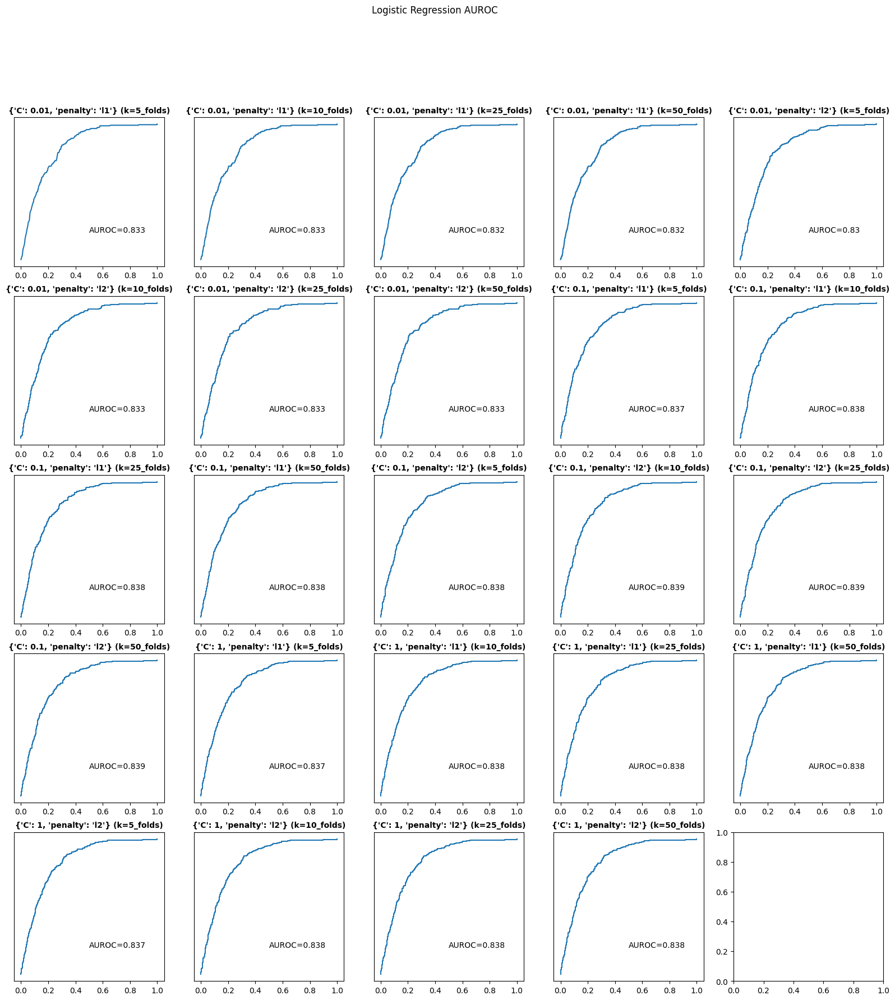

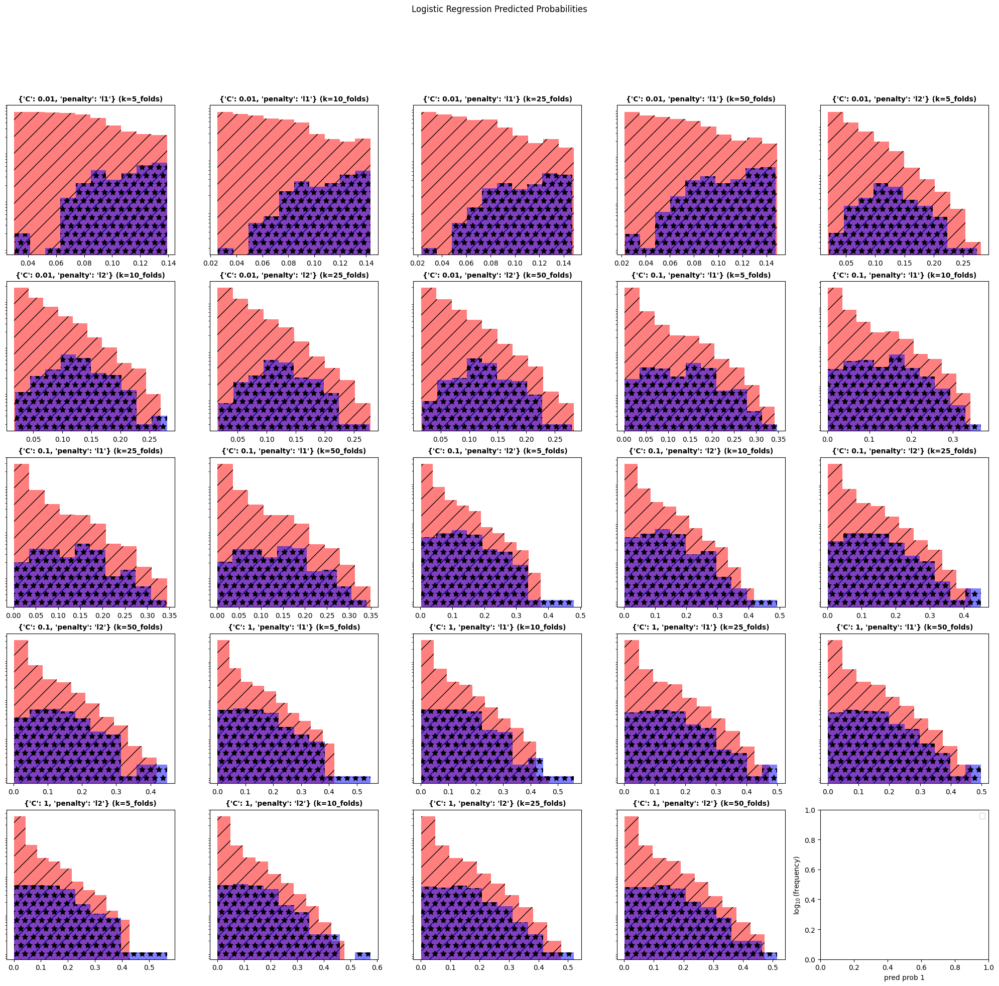

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


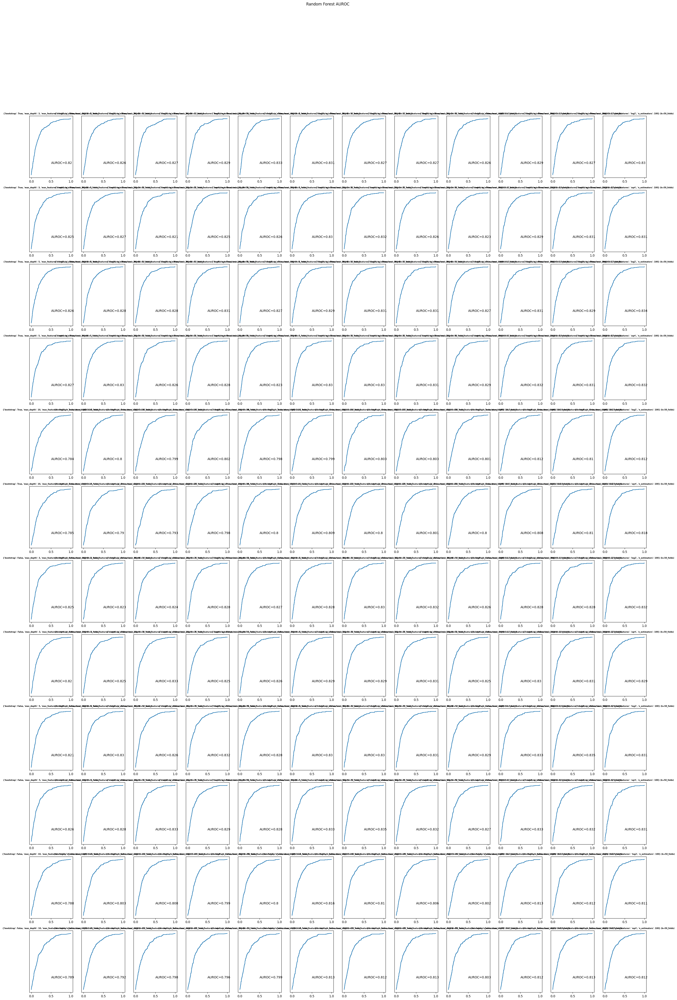

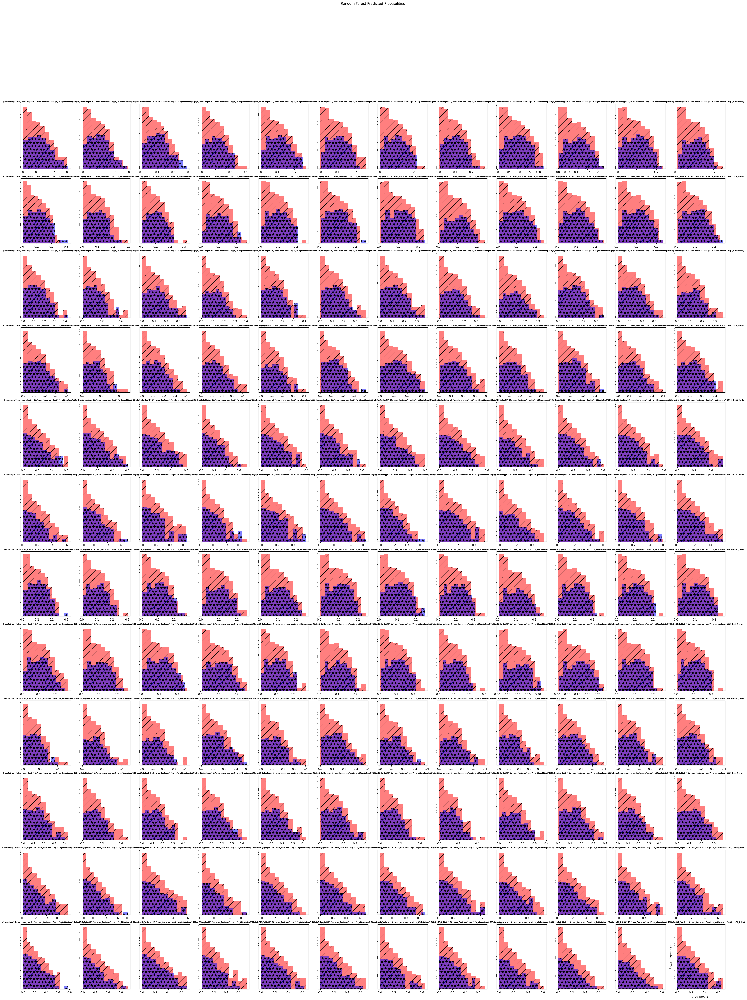

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


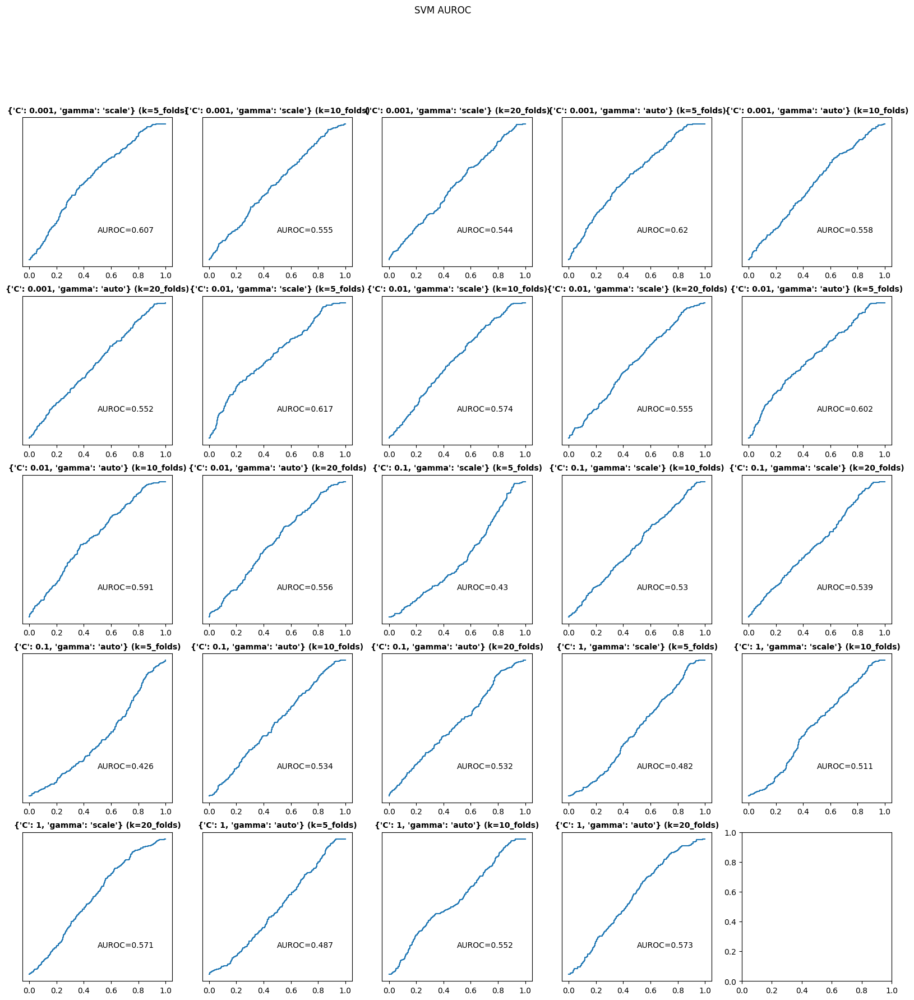

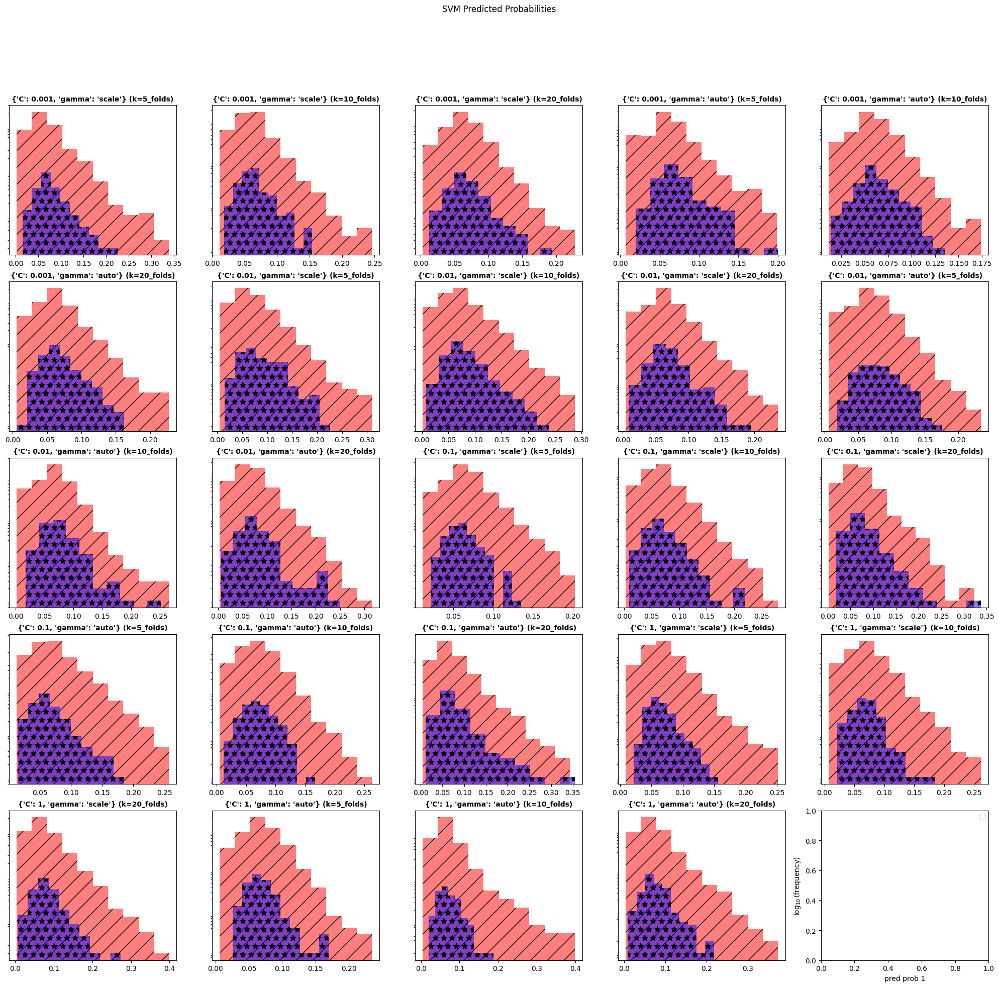

In [216]:
def plotme(n_subplots):
    nrows = round(np.sqrt(n_subplots) + 1)
    ncols = nrows
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols)
    for ax in axes.flat:
        ax.plot([0,1], [0,1])
        ax.set_title('yo')
    plt.show()
#plotme(20)
def plot_performance(performance_dict, title_str = r'Auroc ### samples ($\bf{random\_state=}$'):
    k_folds = [key if (key != 'hyper_params') else None for key in performance_dict.keys()]
    k_folds.remove(None)
    for k_fold in k_folds:
        truth = performance_dict[k_fold]["truth"]
        p_1 = performance_dict[k_fold]["p_1"]
        f1 = performance_dict[k_fold]["f1"]
        acc = performance_dict[k_fold]["acc"]
        fpr, tpr, thres = sklearn.metrics.roc_curve(truth, p_1, pos_label=1)
        auroc = performance_dict[k_fold]["auroc"]
        #random_state = performance_dict[k_fold]["random_state"]
        plt.plot(fpr, tpr, label = f'{k_fold}: AUROC={auroc}') #avg_acc={avg_acc}; avg_f1={avg_f1}')
    plt.xlabel("FPR (False Positive Rate)")
    plt.ylabel("TPR (True Positive Rate)")
    plt.title(f'AUROC (HPs: {performance_dict["hyper_params"]})')
    #plt.title(title_str + f'{random_state})')
    plt.legend()
    plt.show()
    return(plt)

def get_truth_indices_for_pos_and_neg(list_truth):
    idx_pos = []
    idx_neg = []
    for i,t in enumerate(list_truth):
        if t == 1:
            idx_pos.append(i)
        elif t == 0:
            idx_neg.append(i)
        else:
            raise ValueError
    return(
        {'idx_pos': idx_pos, 'idx_neg': idx_neg}
    )

def plot_pred_prob(performance_dict, title_str = ''):
    k_folds = [key if (key != 'hyper_params') else None for key in performance_dict.keys()]
    k_folds.remove(None)
    for k_fold in k_folds:
        truth = performance_dict[k_fold]["truth"]
        truth_indices = get_truth_indices_for_pos_and_neg(truth)
        p_0 = performance_dict[k_fold]["p_0"]
        p_1 = performance_dict[k_fold]["p_1"]
        neg_samples = [p_1[i] for i in truth_indices['idx_neg']]
        pos_samples = [p_1[i] for i in truth_indices['idx_pos']]
        plt.hist(neg_samples, alpha = 0.5, color = 'red', log = True)
        plt.hist(pos_samples, alpha = 0.5, color = 'blue', log=True)
    plt.xlabel('pred prob 1')
    plt.ylabel('$\log_{10}$(frequency)')
    plt.legend()
    plt.title(title_str + f'truth=1(blue) & truth=0(red) (HPs: {performance_dict["hyper_params"]})')
    plt.show()

def plot_performance_new(performance_dict, figsize = (20,20), subtitle_size = 10, suptitle = 'AUROCs'):

    ### setup subplots grid
    hyper_param_keys = [key if (key != 'model') else None for key in performance_dict.keys()]
    hyper_param_keys.remove(None)
    n_hyper_params = len(hyper_param_keys)
    # get the kfold keys for counting, can use the first hyper param
    k_folds_keys = [key if (key != 'hyper_params') else None for key in performance_dict['hp_0'].keys()]
    k_folds_keys.remove(None)
    n_k_folds = len(k_folds_keys)
    min_subplots = n_k_folds * n_hyper_params
    nrows = round(np.sqrt(min_subplots + 1))
    ncols = nrows
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize = figsize)
    permutations = list(itertools.product(hyper_param_keys, k_folds_keys))
    if len(permutations) > nrows * ncols:
        raise ValueError
    ### start plotting
    for hp_fold,ax in zip(permutations, axes.flat):
        hp = hp_fold[0]
        k_fold = hp_fold[1]
        truth = performance_dict[hp][k_fold]['truth']
        p_1 = performance_dict[hp][k_fold]['p_1']
        auroc = performance_dict[hp][k_fold]["auroc"]
        fpr, tpr, thres = sklearn.metrics.roc_curve(truth, p_1, pos_label=1)
        ax.plot(fpr, tpr, label = f'{k_fold}: AUROC={auroc}') #avg_acc={avg_acc}; avg_f1={avg_f1}')
        ax.set_title(f'{performance_dict[hp]["hyper_params"]} (k={k_fold})',  fontsize = subtitle_size, weight = 'bold') 
        ax.text(s = f'AUROC={str(auroc)}', x = 0.5, y = 0.2)
        ax.set_yticks([])
    fig.suptitle(suptitle)
    return()

def plot_pred_prob_new(performance_dict, figsize = (20,20), subtitle_size = 10, suptitle = 'Predicted Probabilities'):
    ### setup subplots grid
    hyper_param_keys = [key if (key != 'model') else None for key in performance_dict.keys()]
    hyper_param_keys.remove(None)
    n_hyper_params = len(hyper_param_keys)
    # get the kfold keys for counting, can use the first hyper param
    k_folds_keys = [key if (key != 'hyper_params') else None for key in performance_dict['hp_0'].keys()]
    k_folds_keys.remove(None)
    n_k_folds = len(k_folds_keys)
    min_subplots = n_k_folds * n_hyper_params
    nrows = round(np.sqrt(min_subplots + 1))
    ncols = nrows
    fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize = figsize)
    permutations = list(itertools.product(hyper_param_keys, k_folds_keys))
    if len(permutations) > nrows * ncols:
        raise ValueError
    ### start plotting
    for hp_fold,ax in zip(permutations, axes.flat):
        hp = hp_fold[0]
        k_fold = hp_fold[1]
        truth = performance_dict[hp][k_fold]["truth"]
        truth_indices = get_truth_indices_for_pos_and_neg(truth)
        #p_0 = performance_dict[hp][k_fold]["p_0"]
        p_1 = performance_dict[hp][k_fold]["p_1"]
        neg_samples = [p_1[i] for i in truth_indices['idx_neg']]
        pos_samples = [p_1[i] for i in truth_indices['idx_pos']]
        ax.hist(neg_samples, alpha = 0.5, color = 'red', log = True, hatch = '/')
        ax.hist(pos_samples, alpha = 0.5, color = 'blue', log=True, hatch = '*')
        ax.set_title(f'{performance_dict[hp]["hyper_params"]} (k={k_fold})',  fontsize = subtitle_size, weight = 'bold') 
        ax.set_yticks([])
    plt.xlabel('pred prob 1')
    plt.ylabel('$\log_{10}$(frequency)')
    plt.legend()
    #plt.title(f'truth=1(blue) & truth=0(red) (HPs: {performance_dict[hp]["hyper_params"]})')
    fig.suptitle(suptitle)
    fig.tight_layout()
    fig.subplots_adjust(top=0.88)
    plt.show()

plot_performance_new(lr_res, suptitle = 'Logistic Regression AUROC')
plot_pred_prob_new(lr_res, suptitle = 'Logistic Regression Predicted Probabilities' )
plot_performance_new(rf_res, figsize=(35,50), subtitle_size=6, suptitle = 'Random Forest AUROC')
plot_pred_prob_new(rf_res, figsize=(35,50), subtitle_size= 6, suptitle = 'Random Forest Predicted Probabilities')
plot_performance_new(svm_res, suptitle = 'SVM AUROC')
plot_pred_prob_new(svm_res, suptitle = "SVM Predicted Probabilities")


In [125]:
p1 = lr_res_per_hp[0]['5_folds']['p_1']
max(p1)


0.1390458321697298

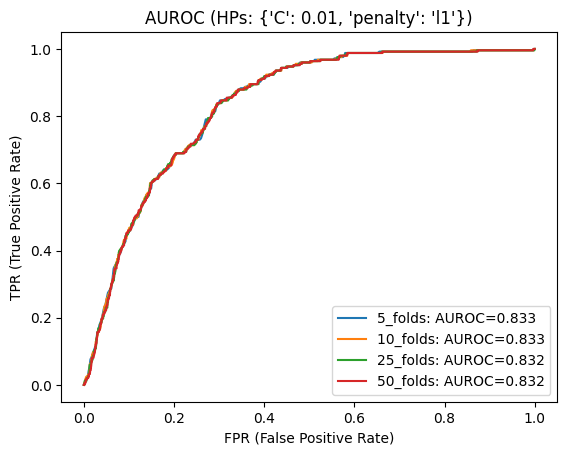

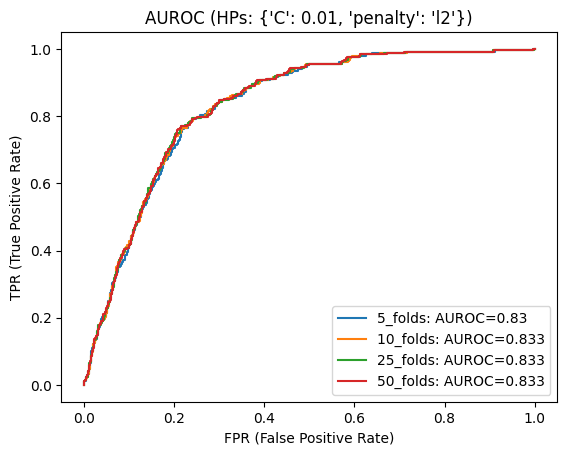

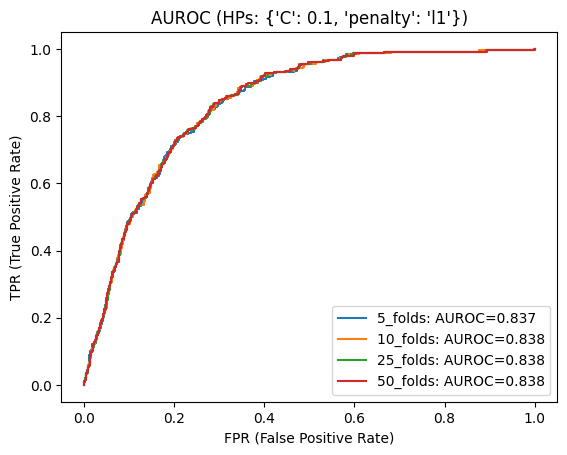

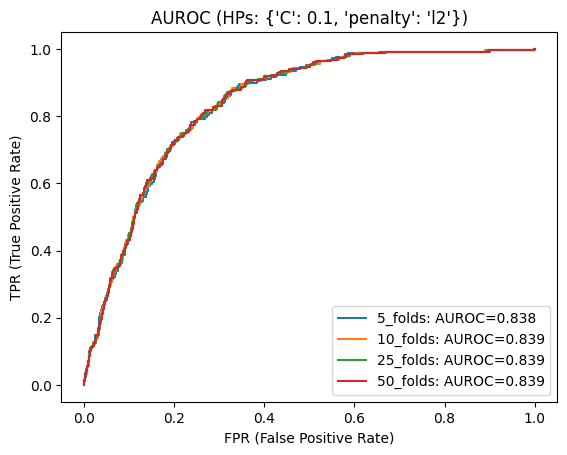

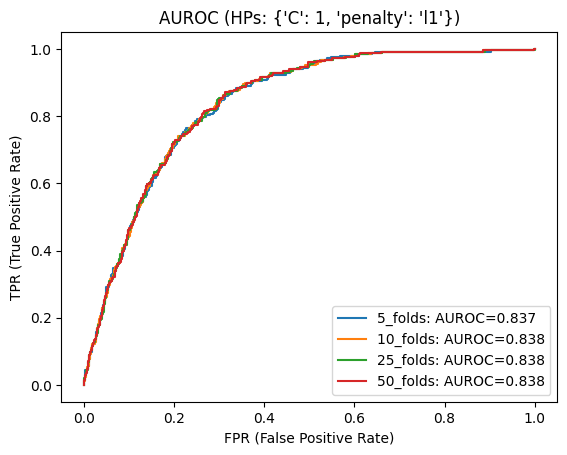

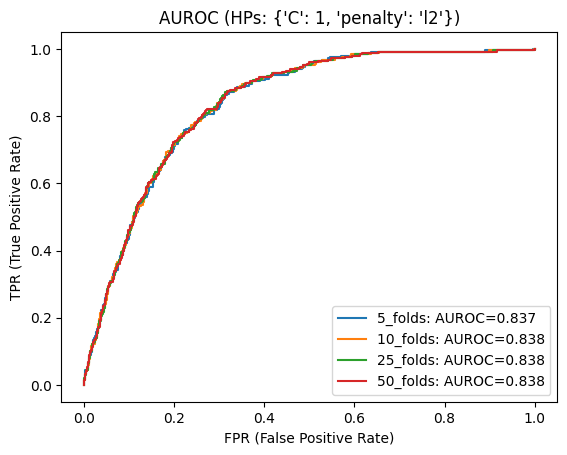

In [127]:
for d in lr_res_per_hp:
    plot_performance(d, title_str = r'AUROC')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


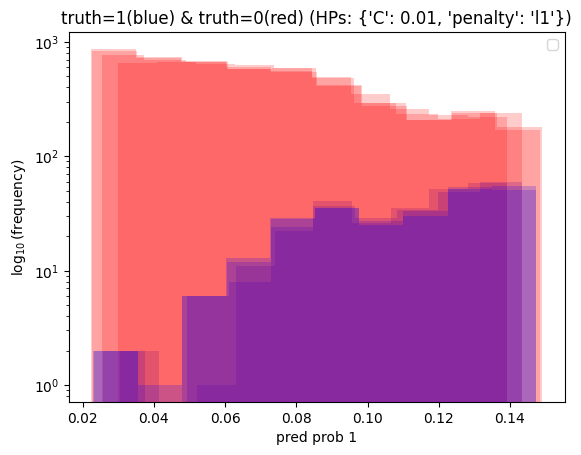

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


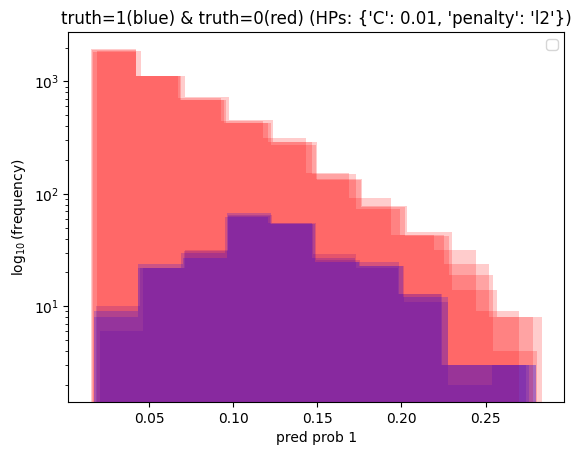

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


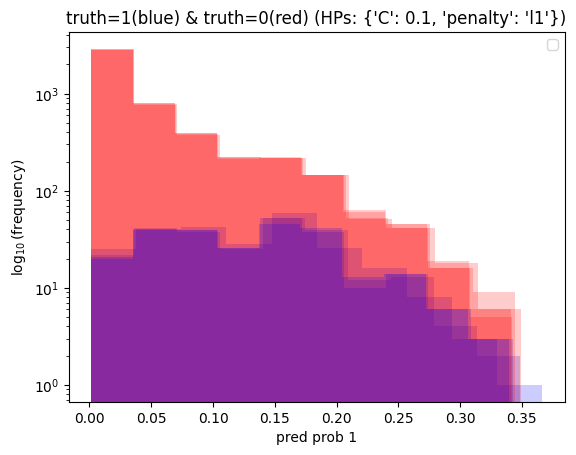

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


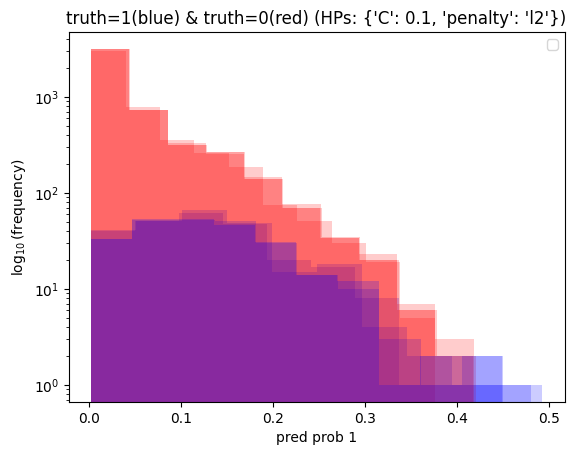

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


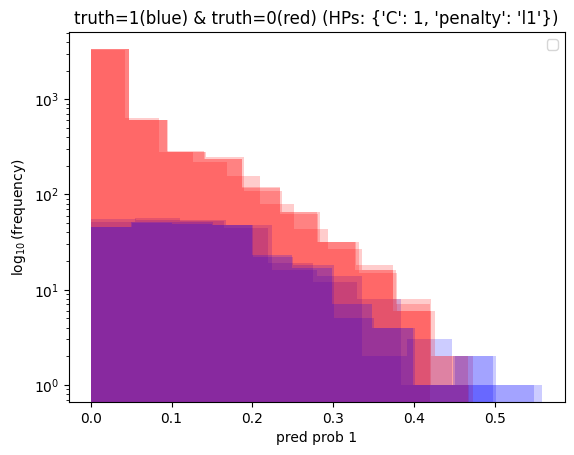

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


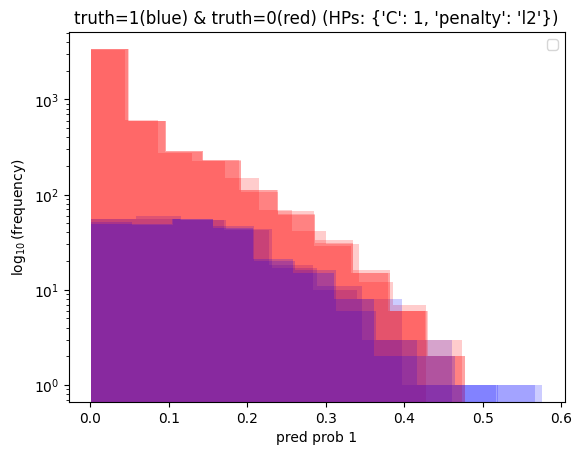

In [142]:
for d in lr_res_per_hp:
    plot_pred_prob(d)

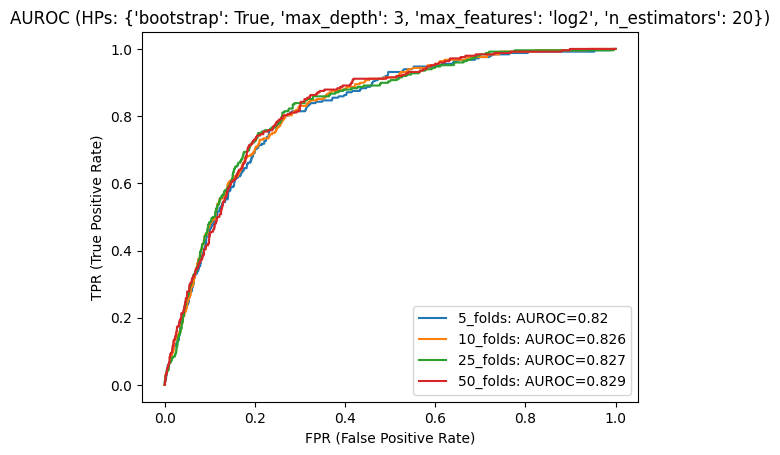

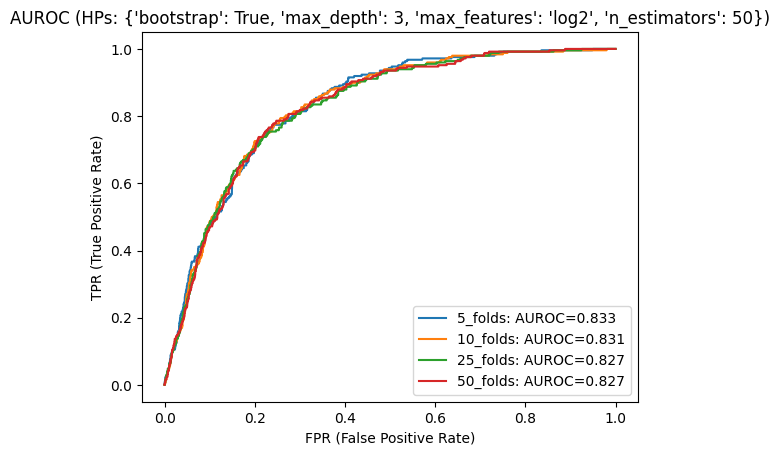

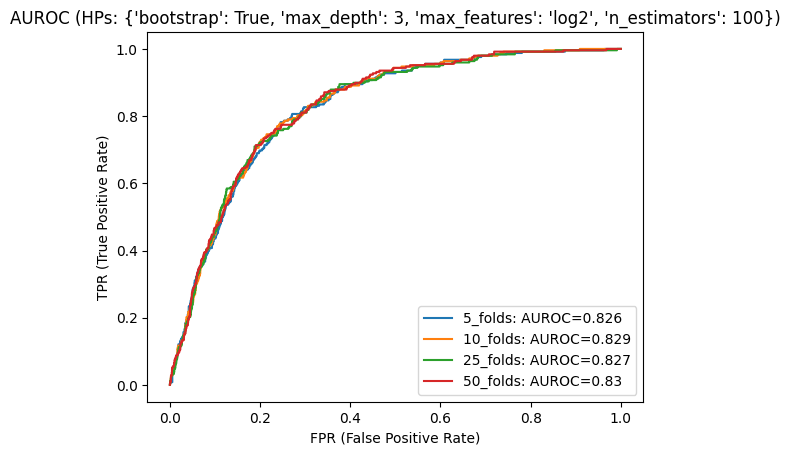

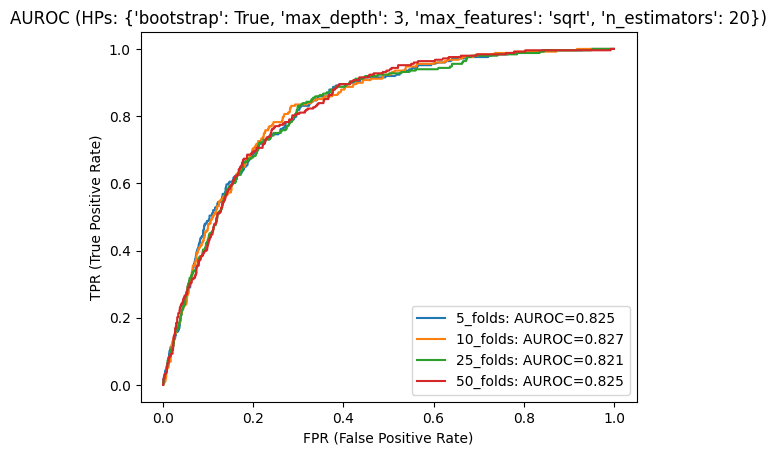

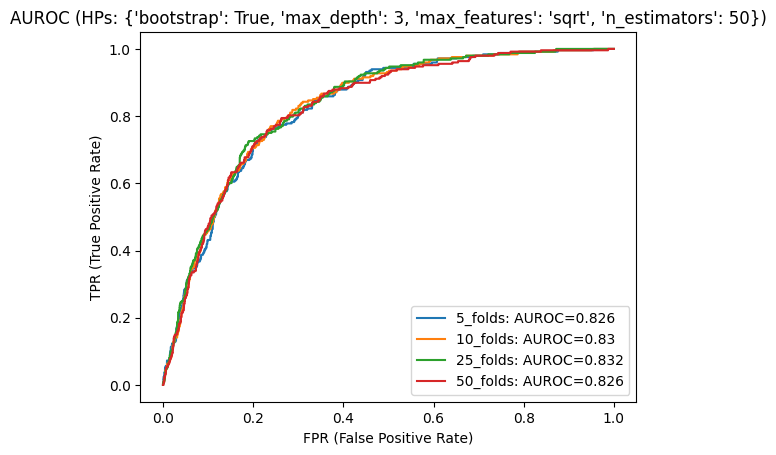

...

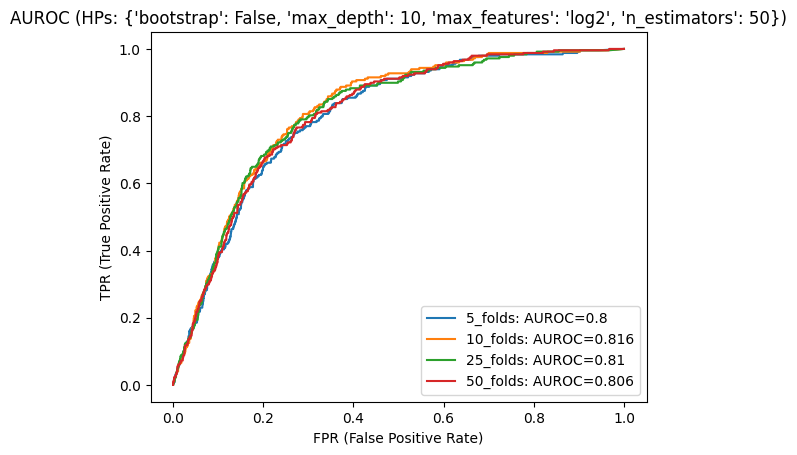

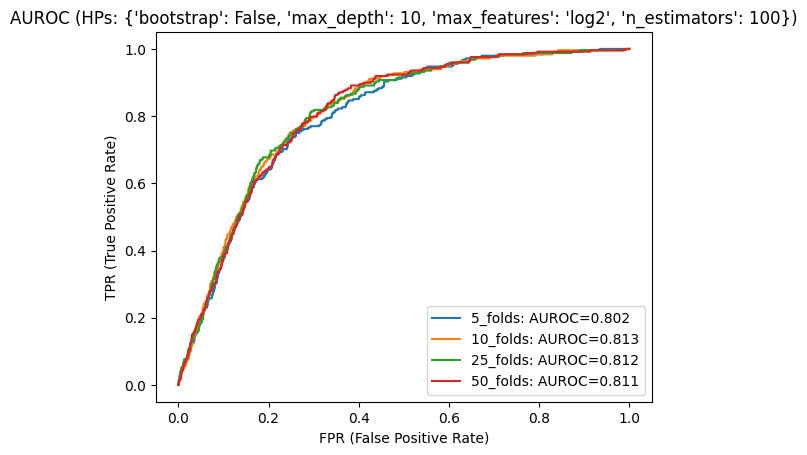

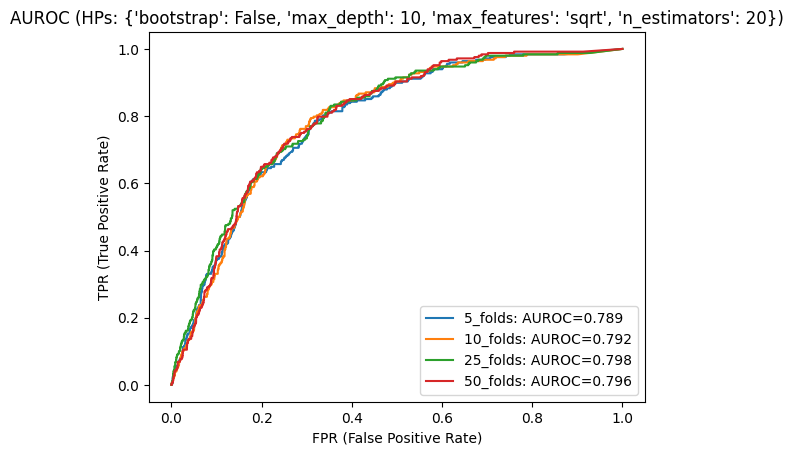

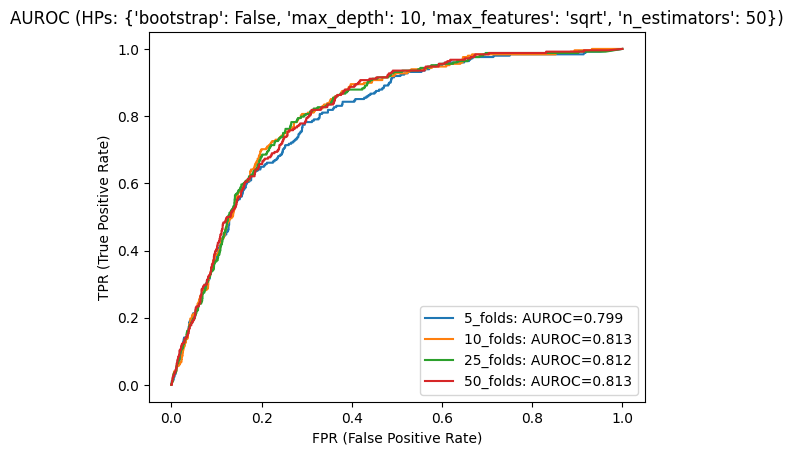

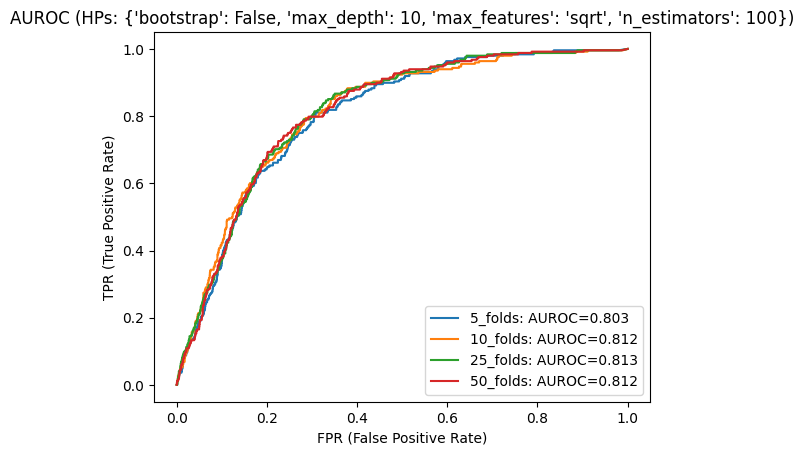

In [132]:
for d in rf_res_per_hp:
    plot_performance(d, title_str= 'RF')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


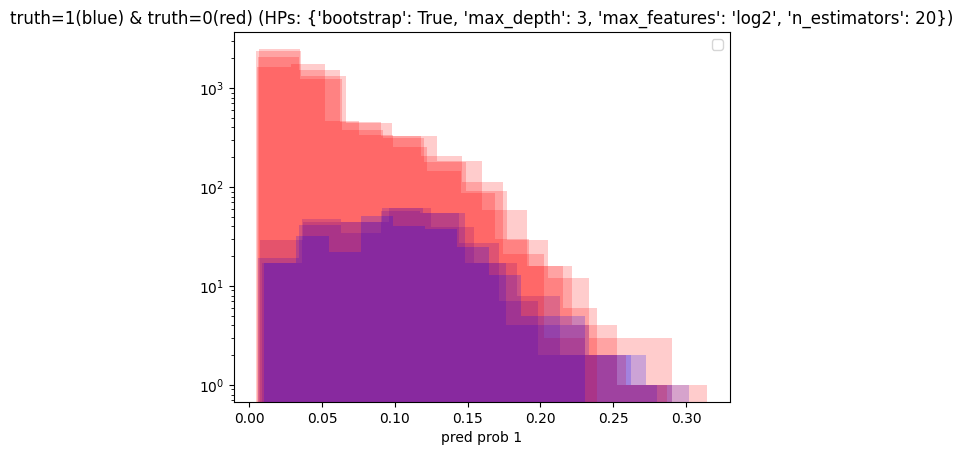

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


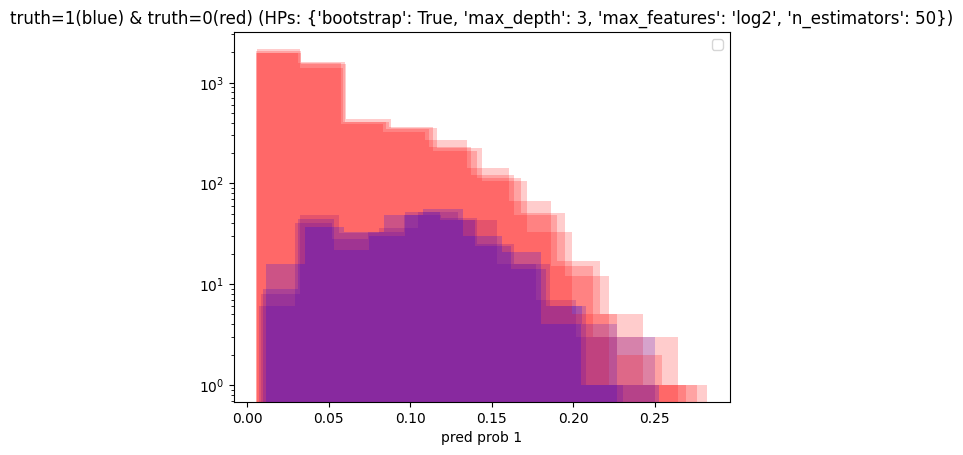

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


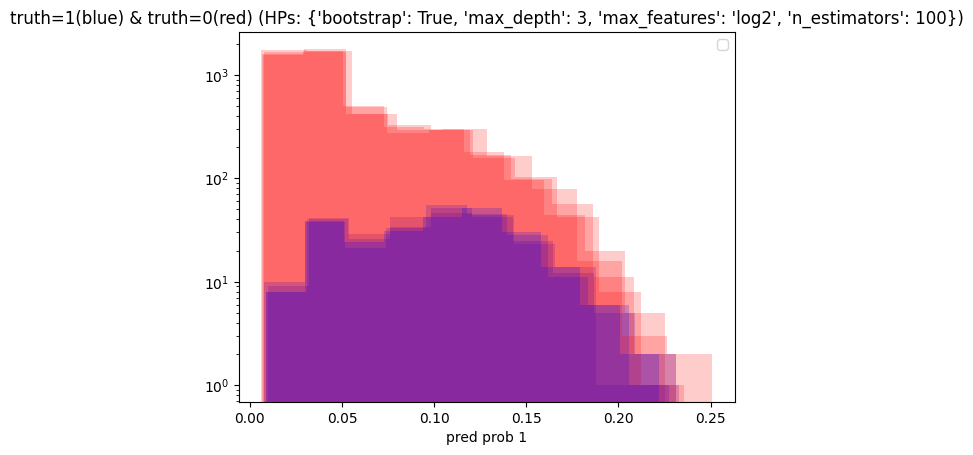

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


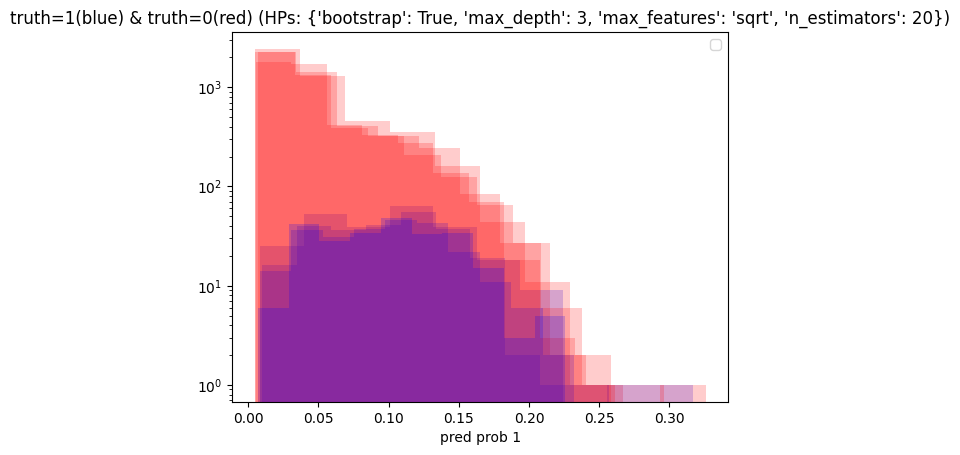

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


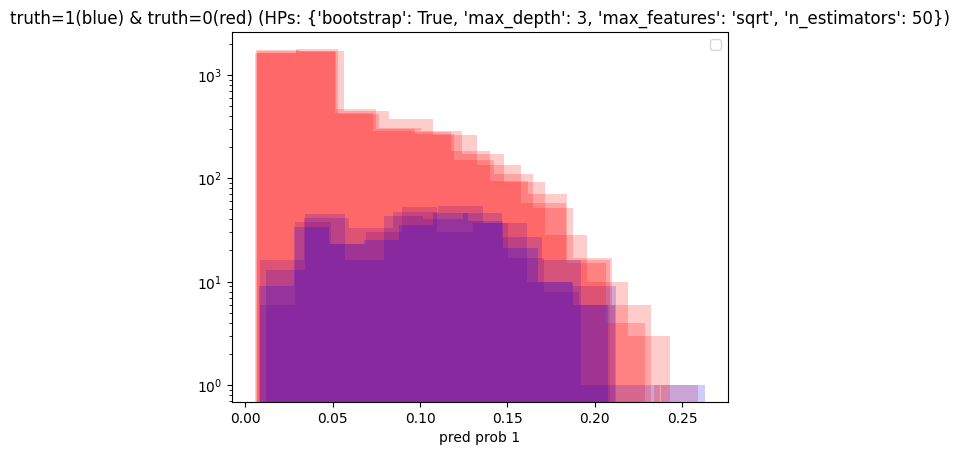

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


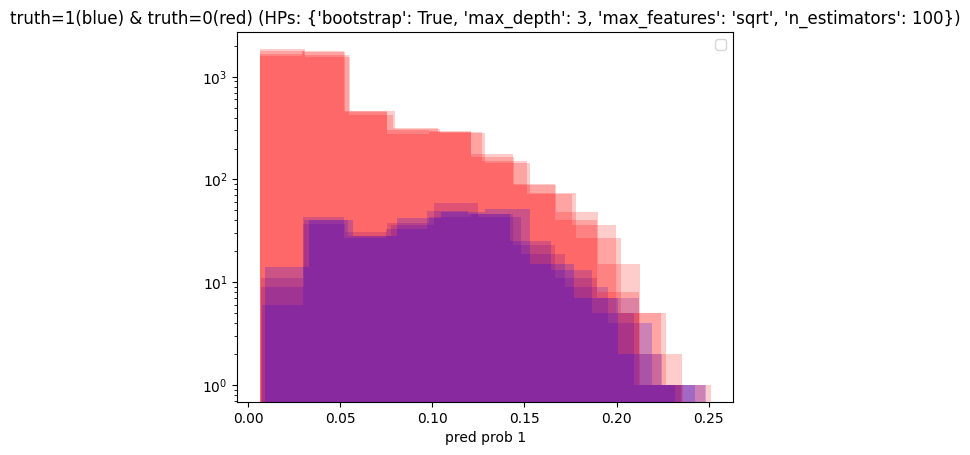

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


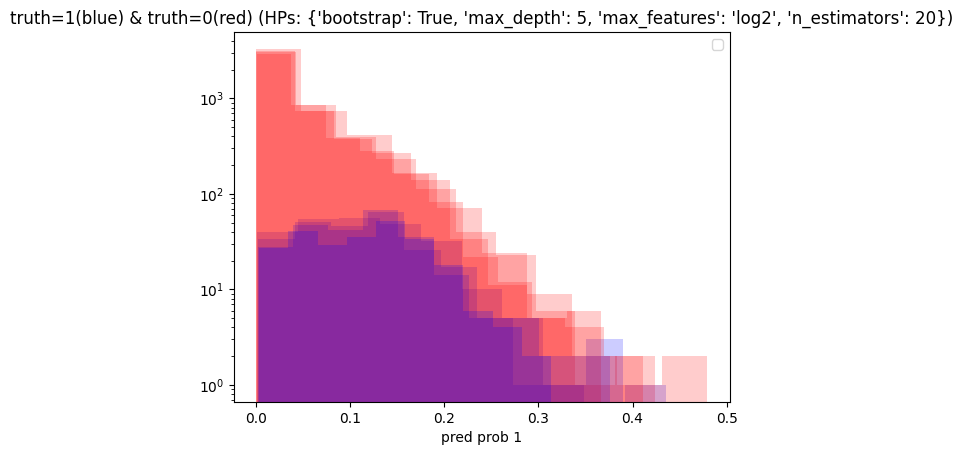

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


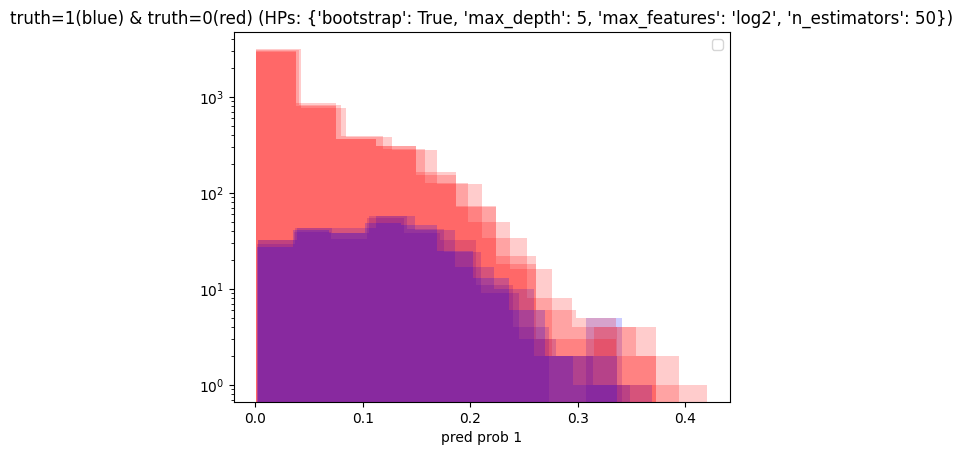

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


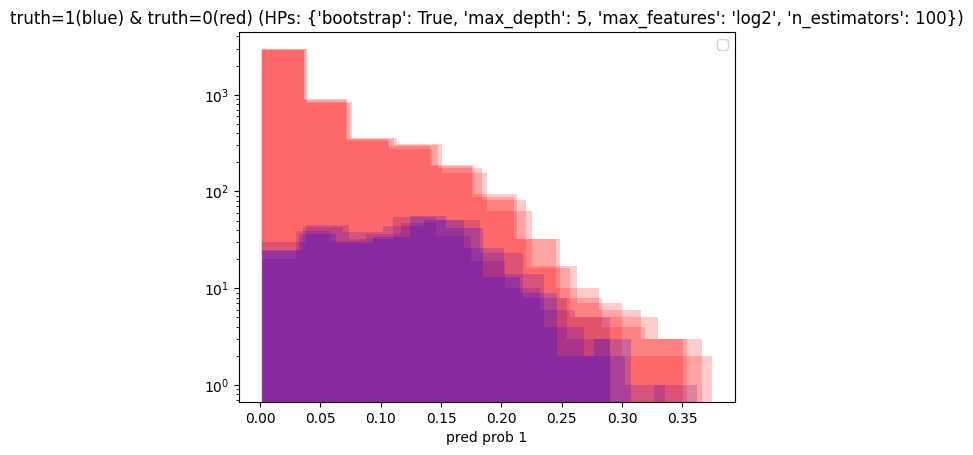

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


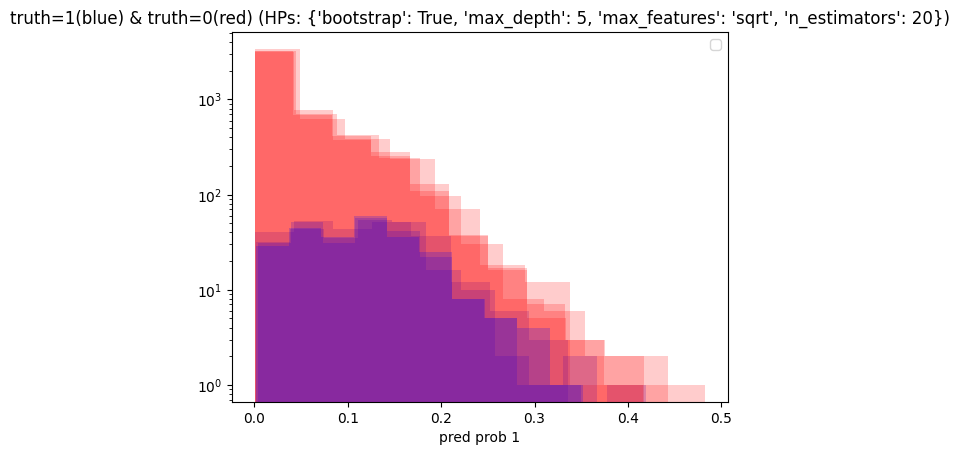

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


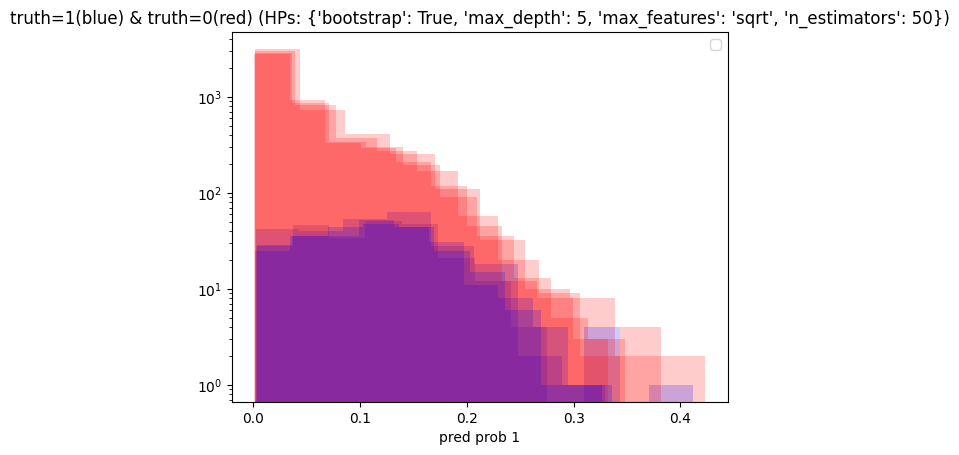

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


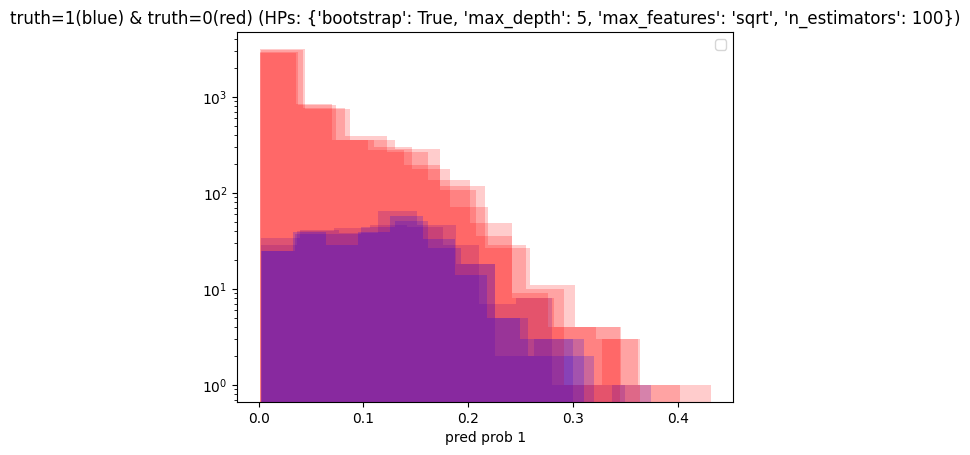

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


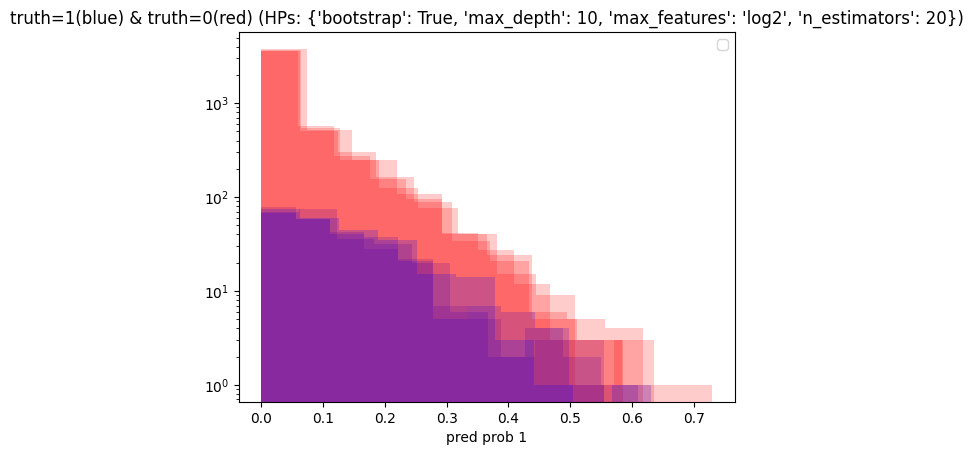

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


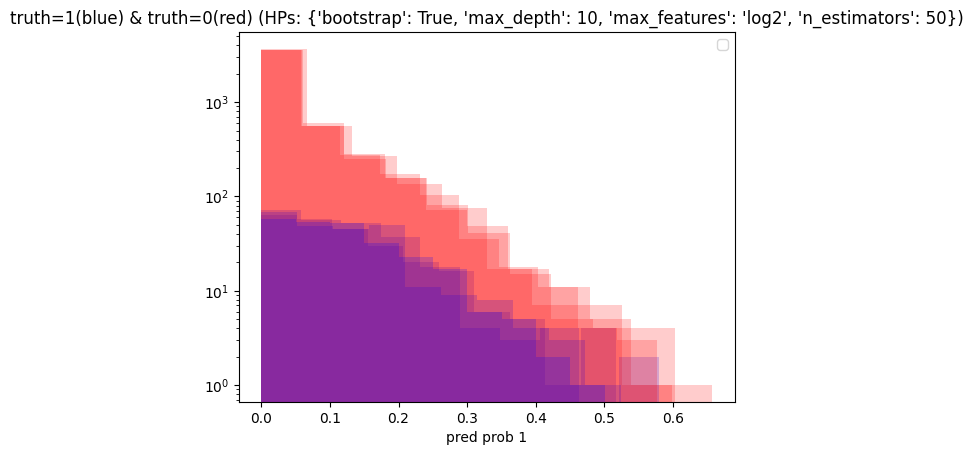

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


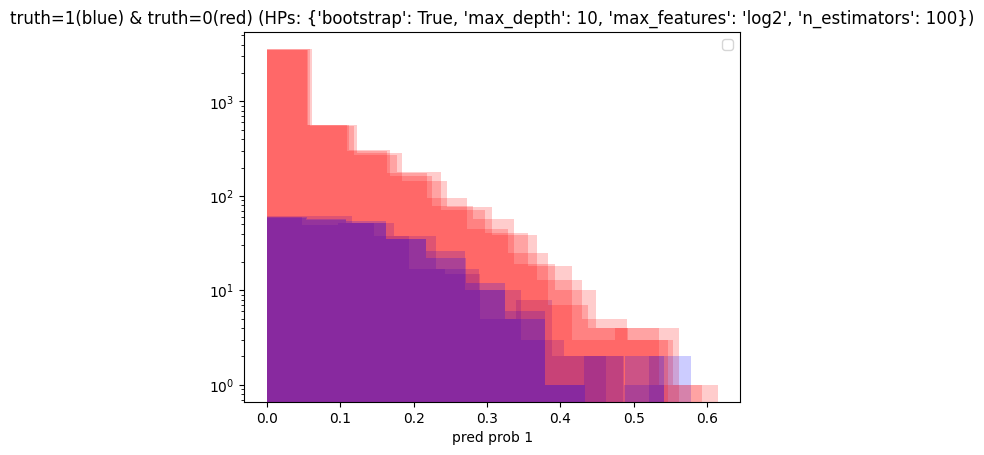

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


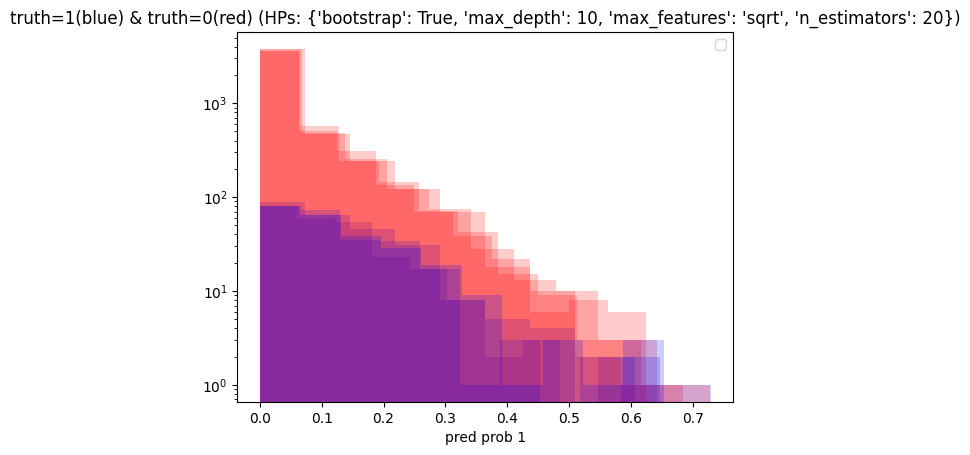

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


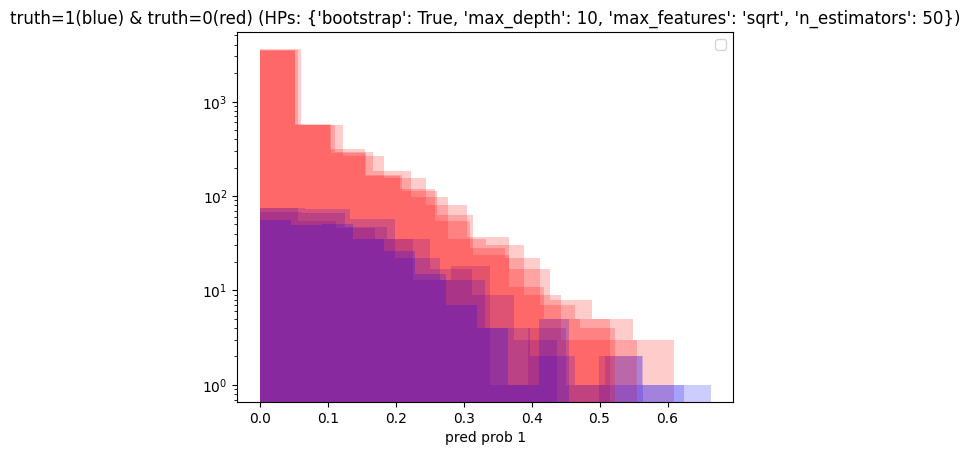

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


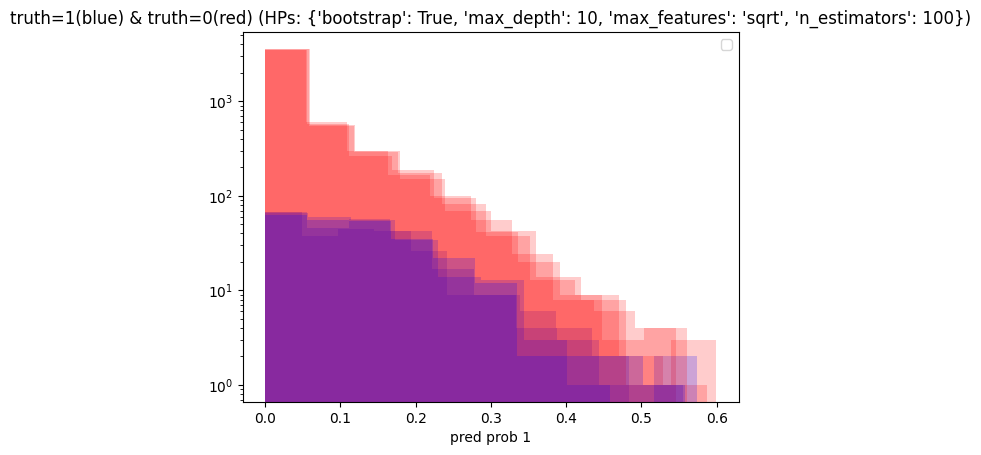

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


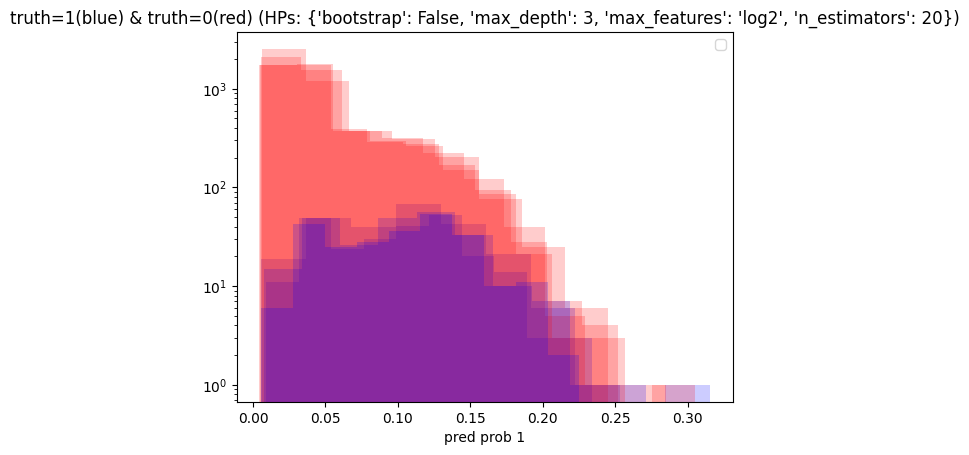

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


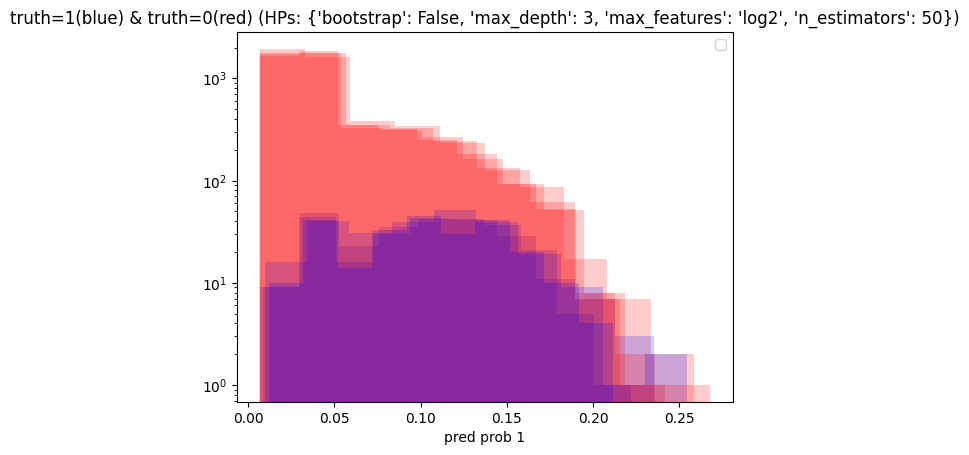

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


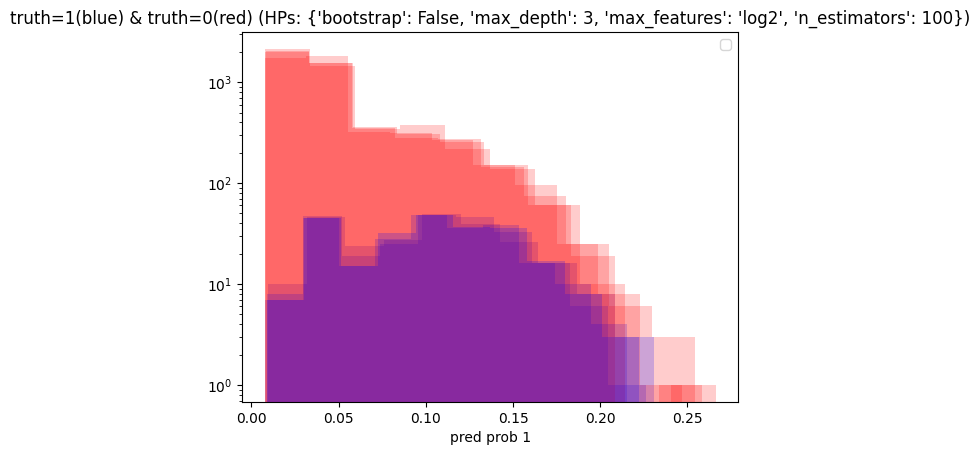

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


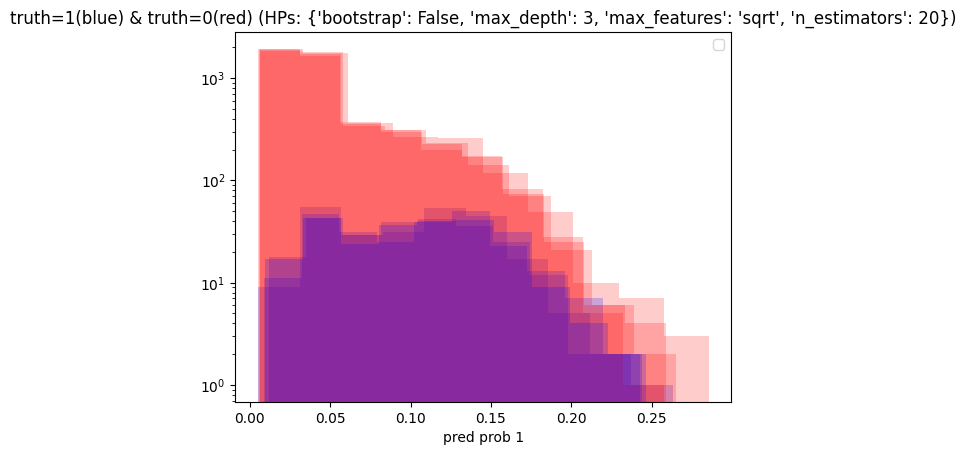

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


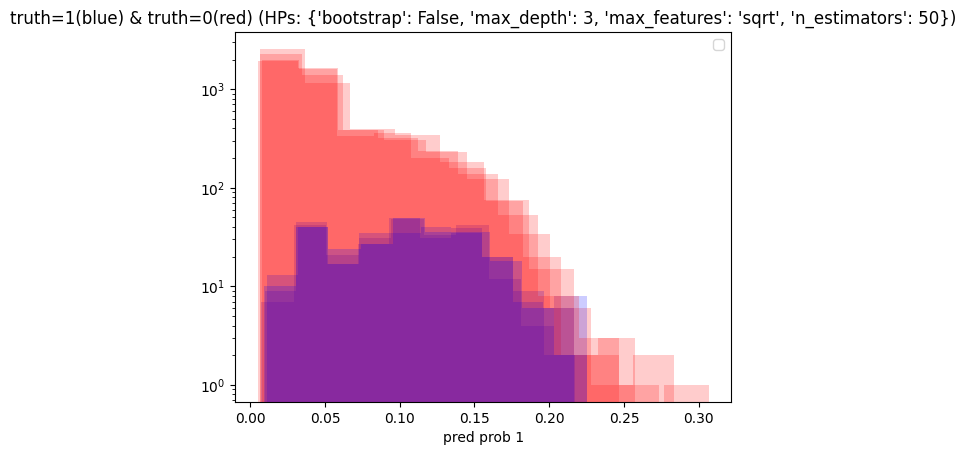

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


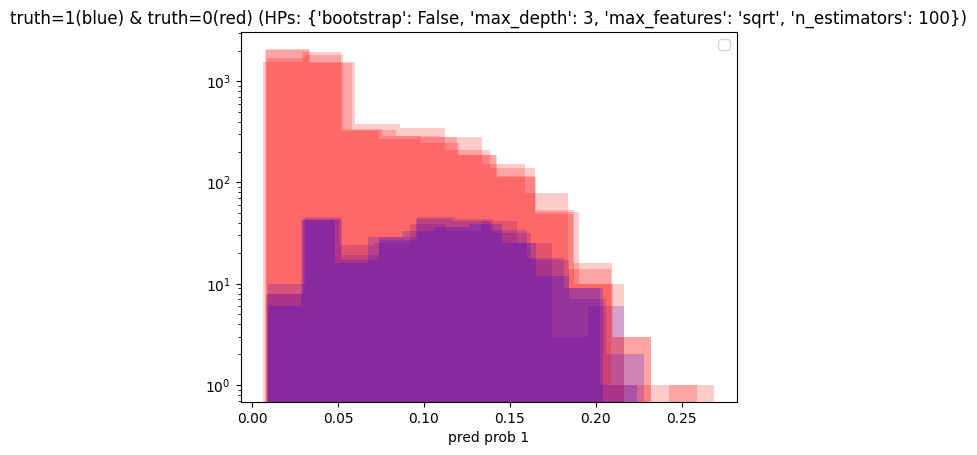

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


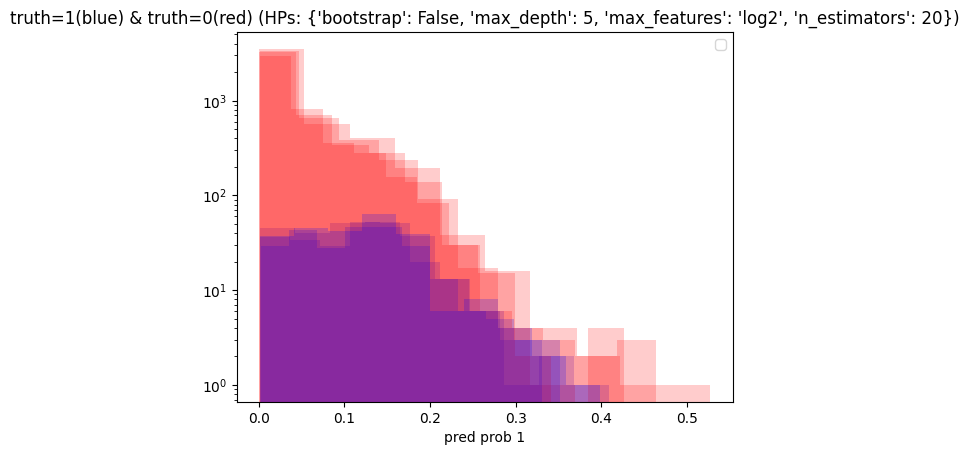

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


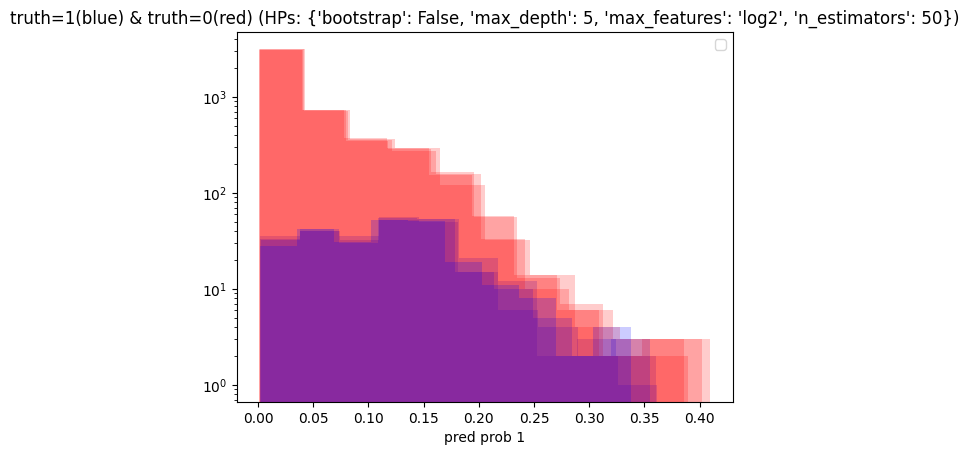

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


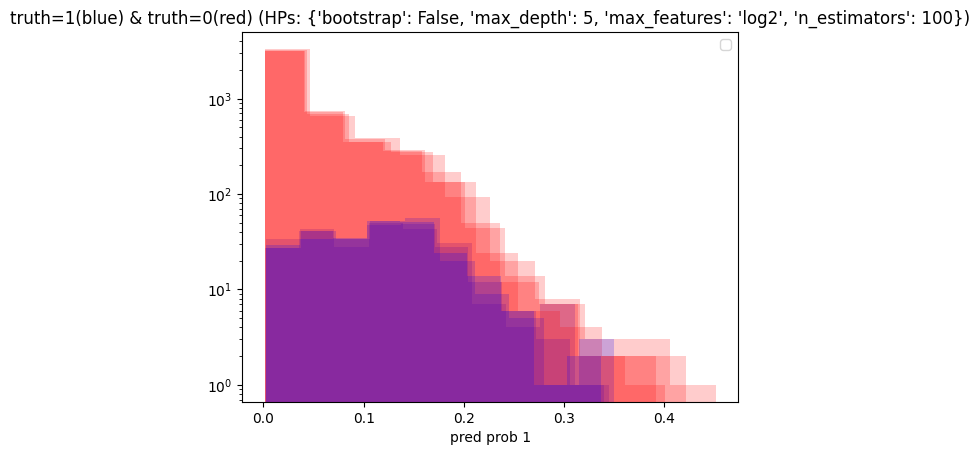

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


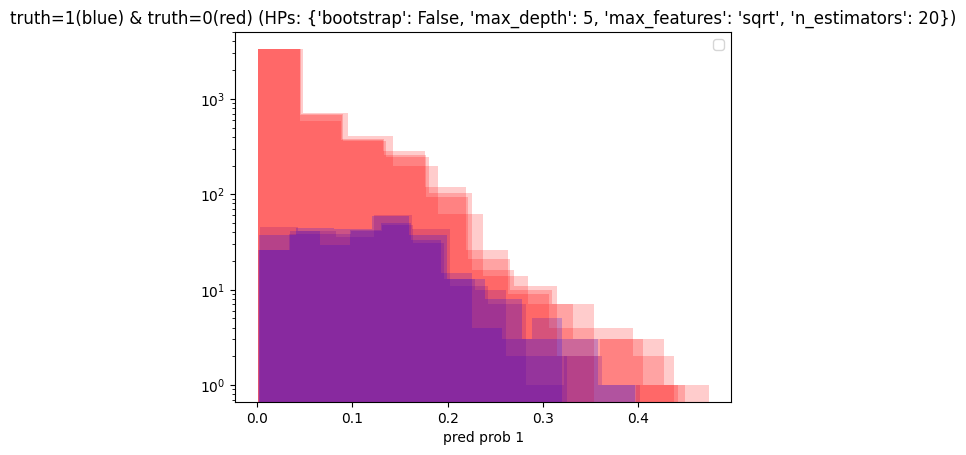

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


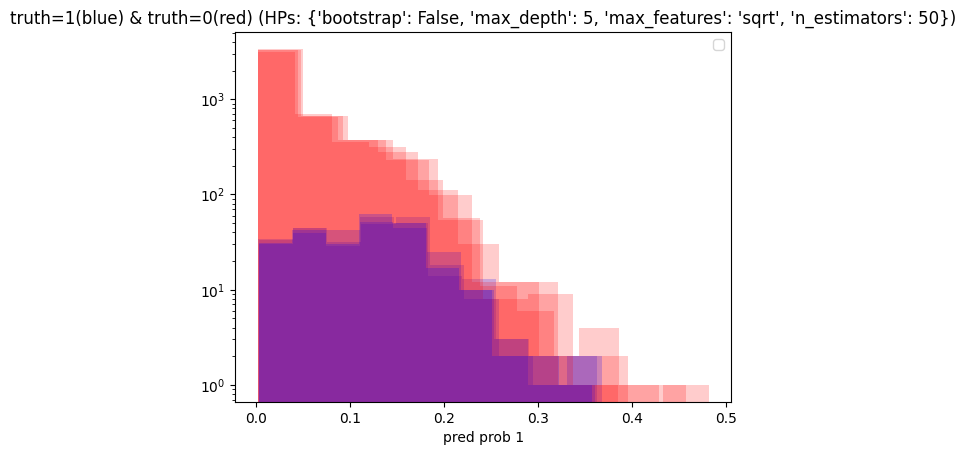

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


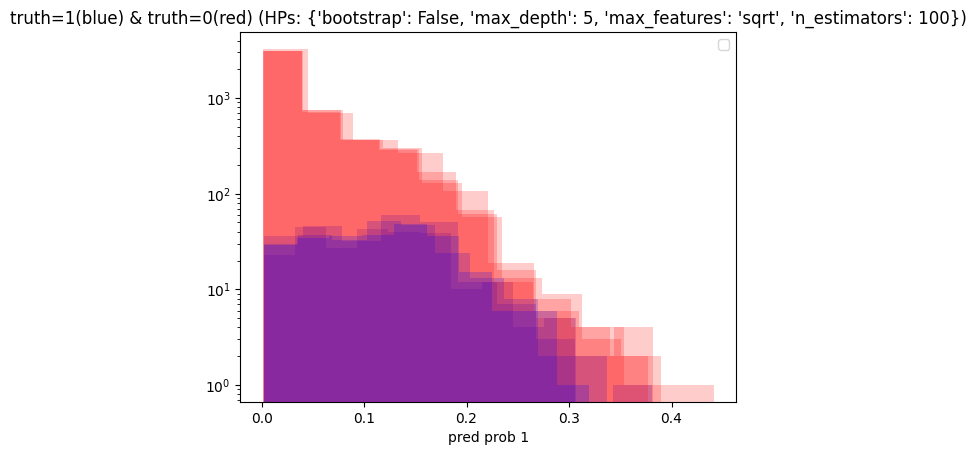

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


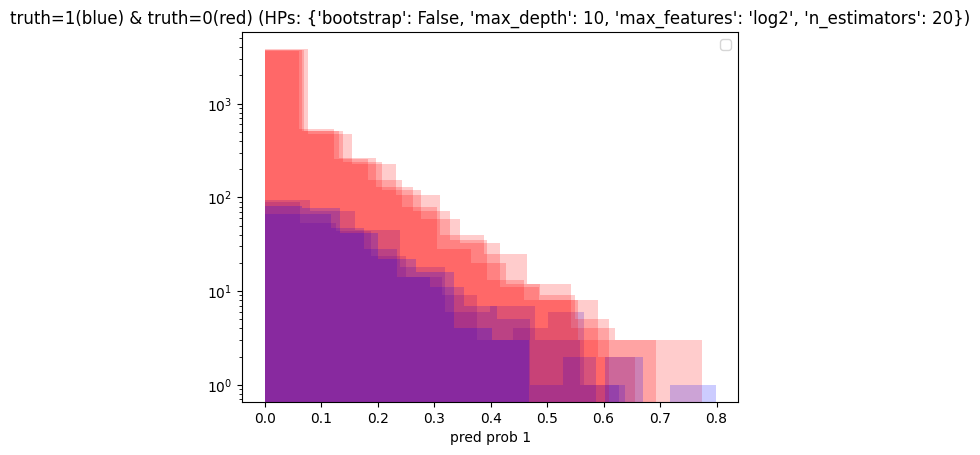

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


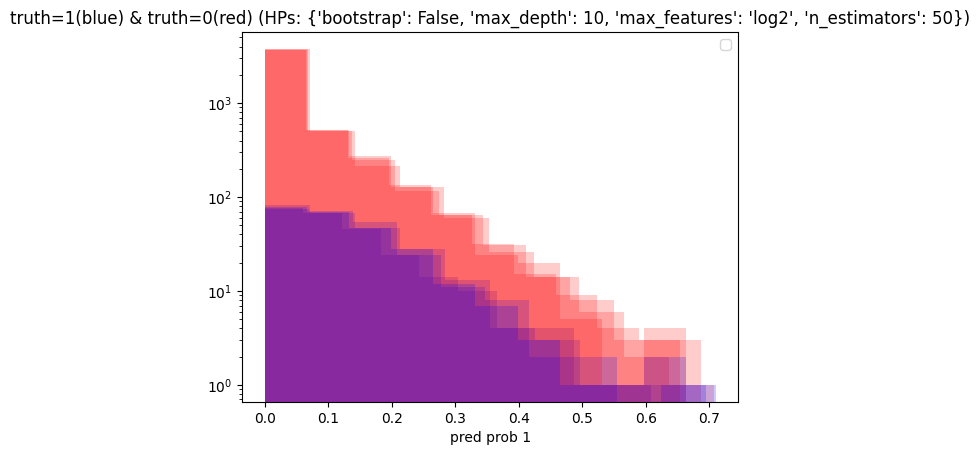

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


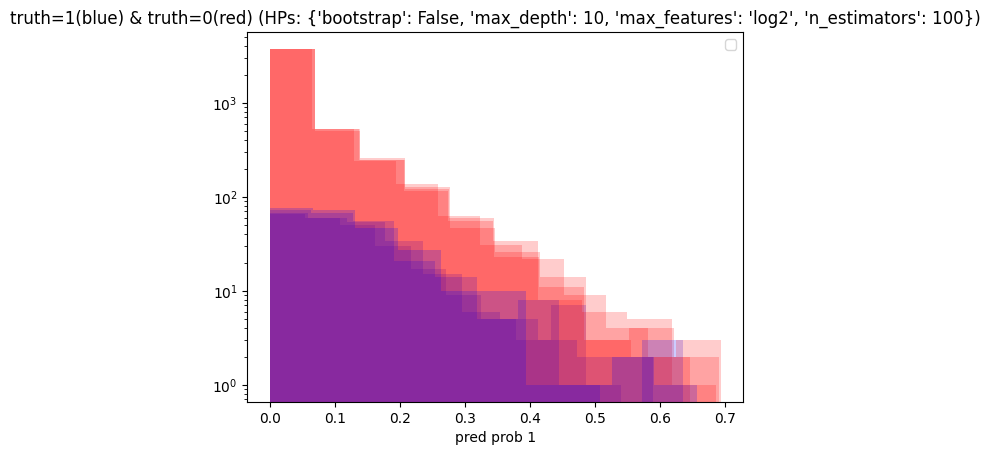

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


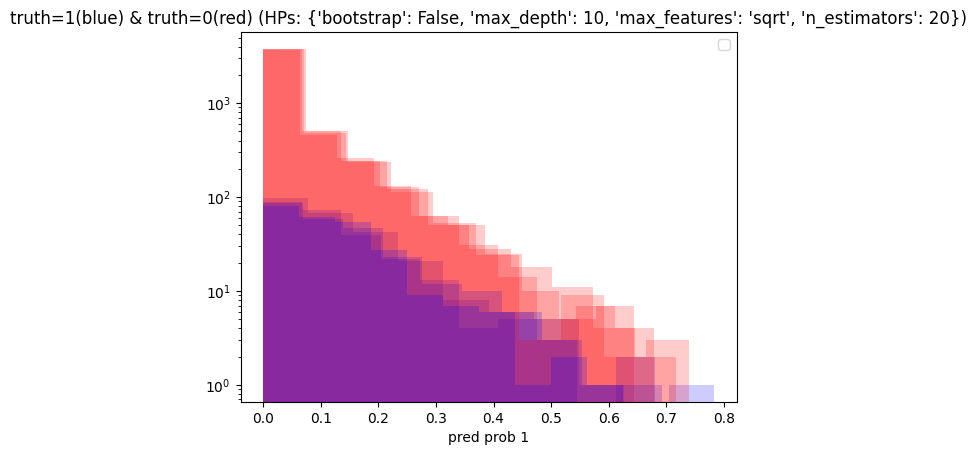

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


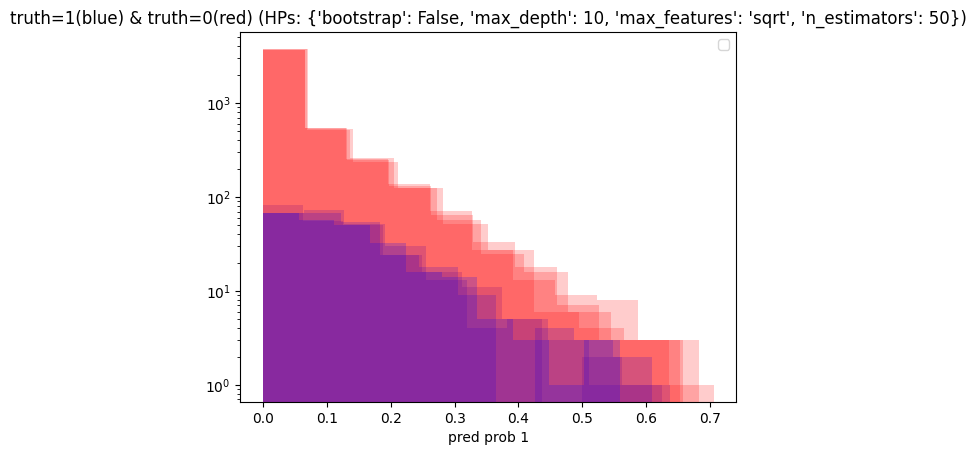

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


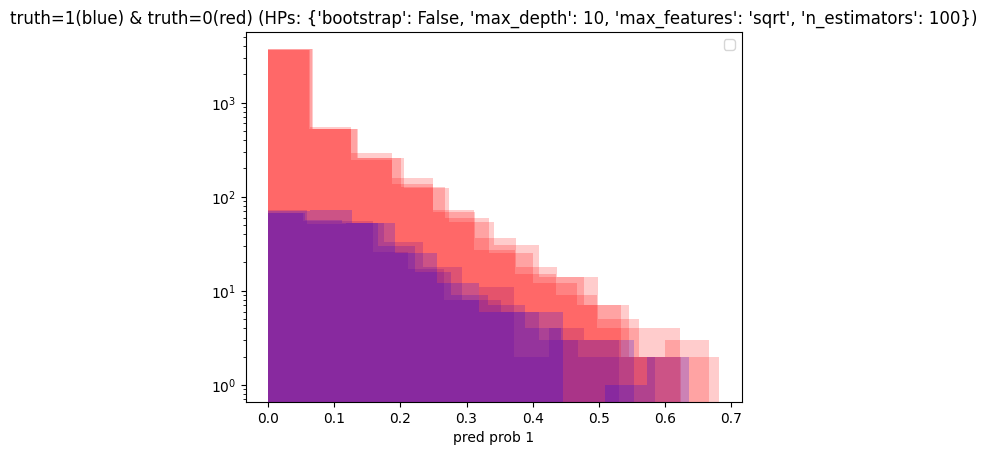

In [135]:
for d in rf_res_per_hp:
    plot_pred_prob(d)

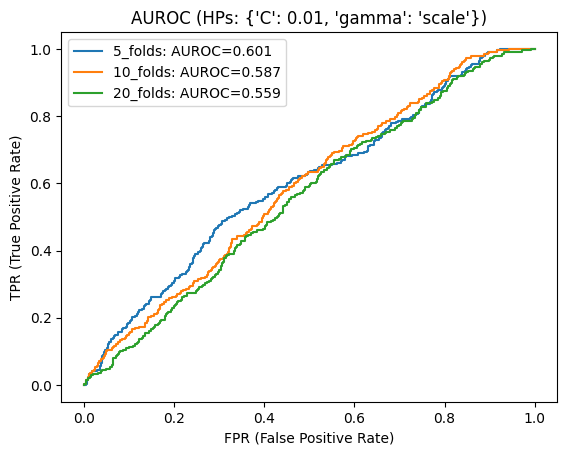

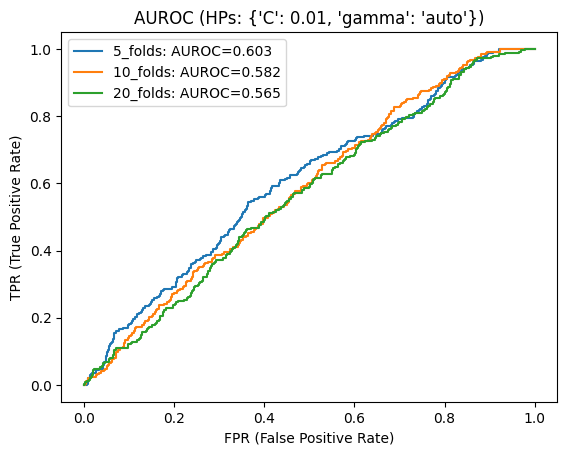

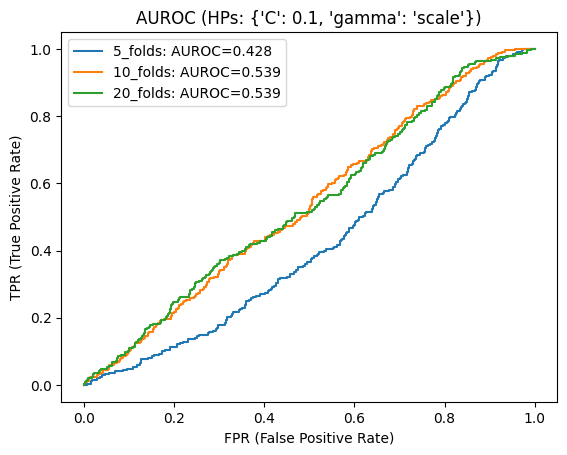

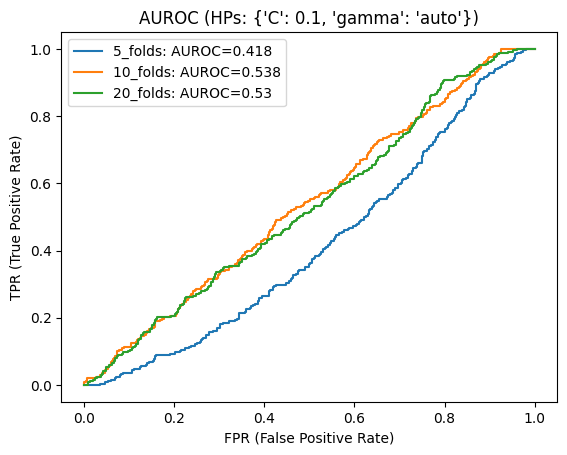

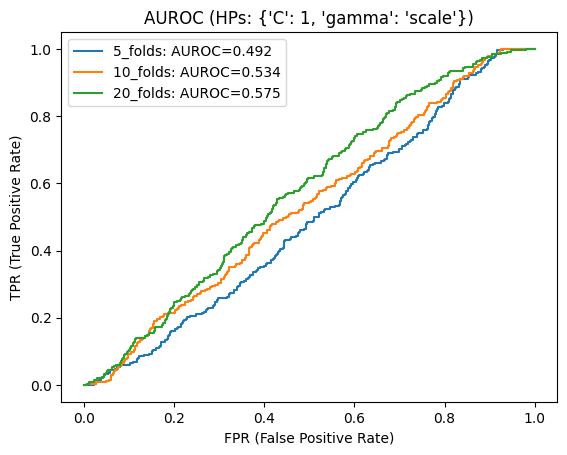

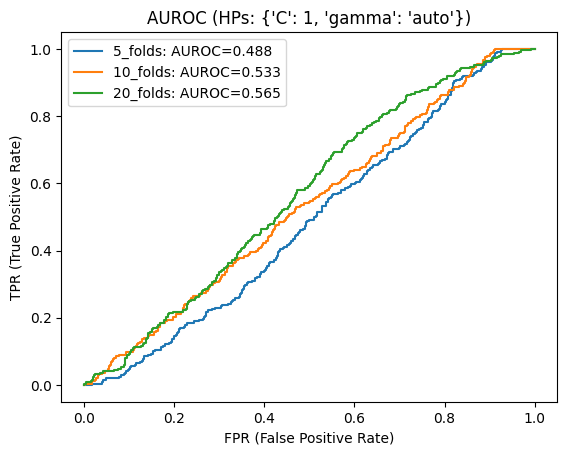

In [78]:
for d in svm_res_per_hp:
    plot_performance(d, title_str= 'SVM')

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


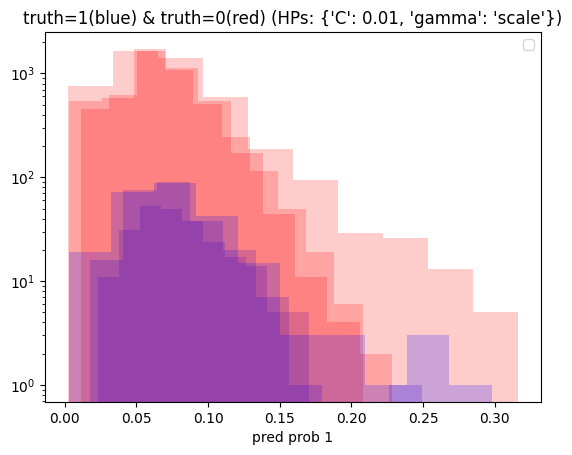

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


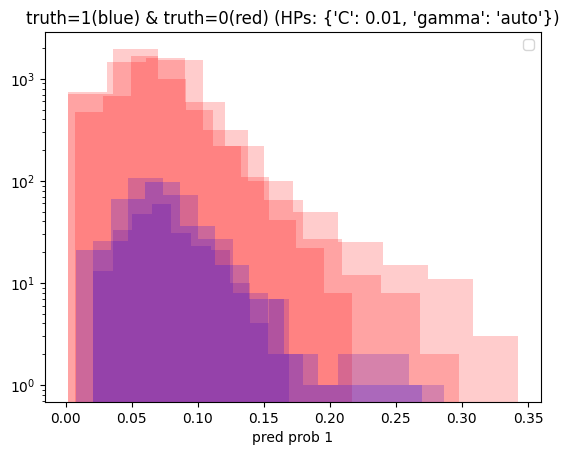

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


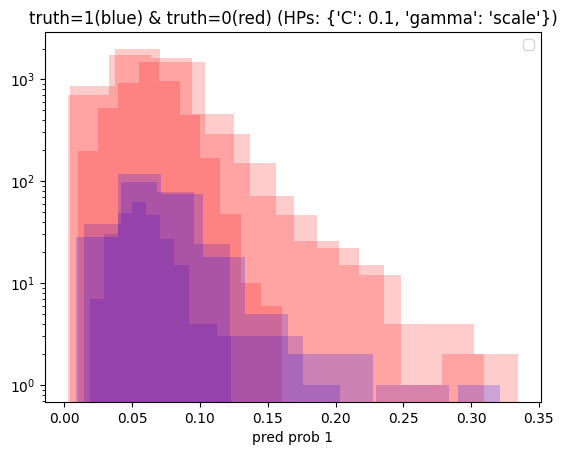

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


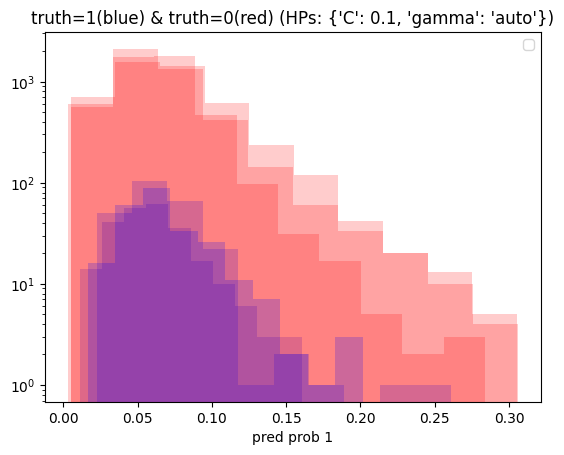

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


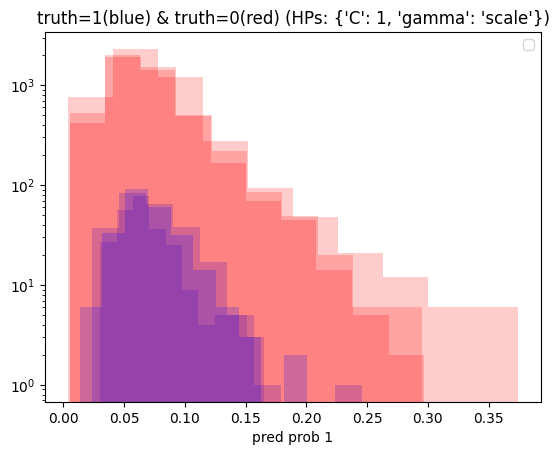

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


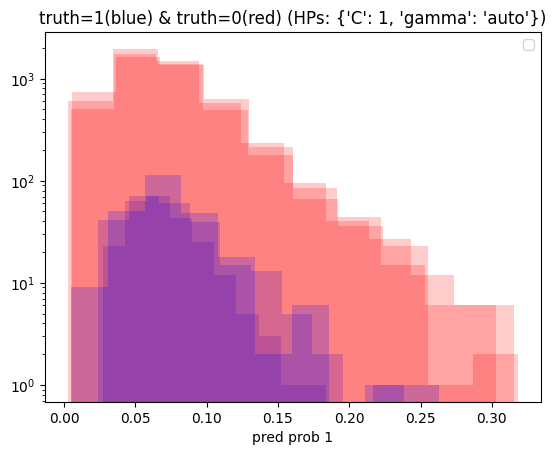

In [136]:
for d in svm_res_per_hp:
    plot_pred_prob(d)